In [1]:
%load_ext autoreload
%autoreload 3

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina' # high res plotting

import sys
sys.path.append('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam')
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/'))
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/'))
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/shared_helper_modules'))

# General imports
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
import warnings
import pickle
import glob


warnings.filterwarnings(
    "ignore",
    message="use_inf_as_na option is deprecated",
    category=FutureWarning,
    module="seaborn")

warnings.filterwarnings(
    "ignore",
    message=r"invalid value encountered in log10",
    category=RuntimeWarning,
    module=r".*specparam.*",
)


# NeuroDSP and FOOOF modules
from neurodsp import spectral

from specparam import Bands


# Custom modules

from spk_feat_cluster_analysis import *

from spe1_plotting import *
from spikeparam.patch.fit import Spike

from config import NPX_CHANNELS, CELL_IDS, DICT_PATCH_FS, DICT_CHAN_PRED, DICT_SPK_THRESH, FILTER_SETTINGS, SPE1_DATA_ROOT, SPE1_PICKLE_ROOT


In [3]:
cell_num = 21 #MODIFY THIS WHEN RUNNING DIFFERENT CELLS 

npx_fs = 30000 # sampling rate
lfp_fs = 3500 # sampling rate

patch_fs = DICT_PATCH_FS[cell_num ]
spk_thresh = DICT_SPK_THRESH[cell_num]

npx_channels = NPX_CHANNELS
npx_patch_channel = DICT_CHAN_PRED[cell_num ]



In [4]:
# Parameters
FORCE_CLUSTER = False


### Loading spe-1 data:

I moved the data loading steps to a separate Jupyter Notebook (spe-1_load_data)




## Cell   
### Analyze Gamma LFP and whole patch clamp AP relationship for cell 

## Step 0: Get loaded data 

In [5]:
lfp_dir = os.path.join(SPE1_DATA_ROOT, 'filt_lfp_recordings', f'c{cell_num}_lfp.npy')
patch_dir = os.path.join(SPE1_DATA_ROOT, 'filt_patch_recordings', f'c{cell_num}_patch.npy')


In [6]:
#get LFP data
lfp_filt = np.load(lfp_dir)
lfp_one_ms = float(lfp_fs / 1000)
lfp_times = np.arange(0, np.shape(lfp_filt)[0]) / lfp_one_ms # in ms instead of sec

#get patch data 
patch_filt = np.load(patch_dir)
patch_one_ms = float(patch_fs  / 1000)
patch_times = np.arange(0, np.shape(patch_filt )[0]) / patch_one_ms # in ms instead of sec

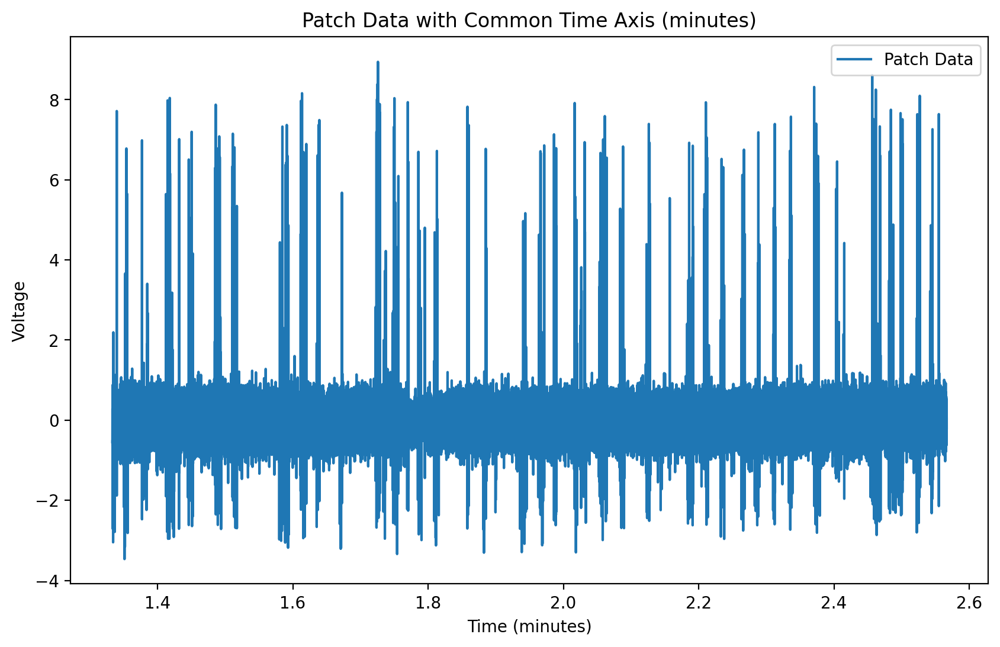

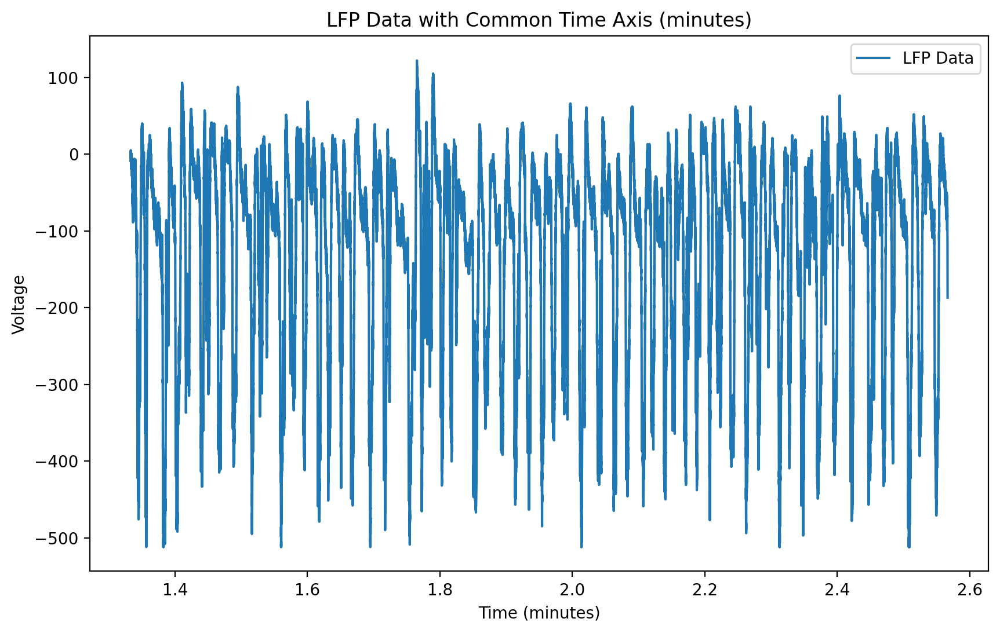

In [7]:
# Plot simultaneous patch and LFP data
# Convert time arrays to minutes
patch_times_min = patch_times / 60000  # Convert milliseconds to minutes
lfp_times_min = lfp_times / 60000  # Convert milliseconds to minutes

# Set the common time axis in minutes (e.g., from 13.3333 to 35.6667 minutes)
common_time_range_min = np.arange(80000 / 60000, 154000 / 60000, 1 / 60000)  # Adjust as needed

# Interpolate patch data onto the common time axis
patch_interp = np.interp(common_time_range_min, patch_times_min, patch_filt)

# Interpolate LFP data onto the common time axis
lfp_interp = np.interp(common_time_range_min, lfp_times_min, lfp_filt)

# Plot patch data with common time axis in minutes
plt.figure(figsize=(10, 6))
plt.plot(common_time_range_min, patch_interp, label='Patch Data')
plt.xlabel('Time (minutes)')
plt.ylabel('Voltage')
plt.title('Patch Data with Common Time Axis (minutes)')
plt.legend()
plt.show()

# Plot LFP data with common time axis in minutes
plt.figure(figsize=(10, 6))
plt.plot(common_time_range_min, lfp_interp, label='LFP Data')
plt.xlabel('Time (minutes)')
plt.ylabel('Voltage')
plt.title('LFP Data with Common Time Axis (minutes)')
plt.legend()
plt.show()

## STEP 1: Detect and fit spikes from patch data

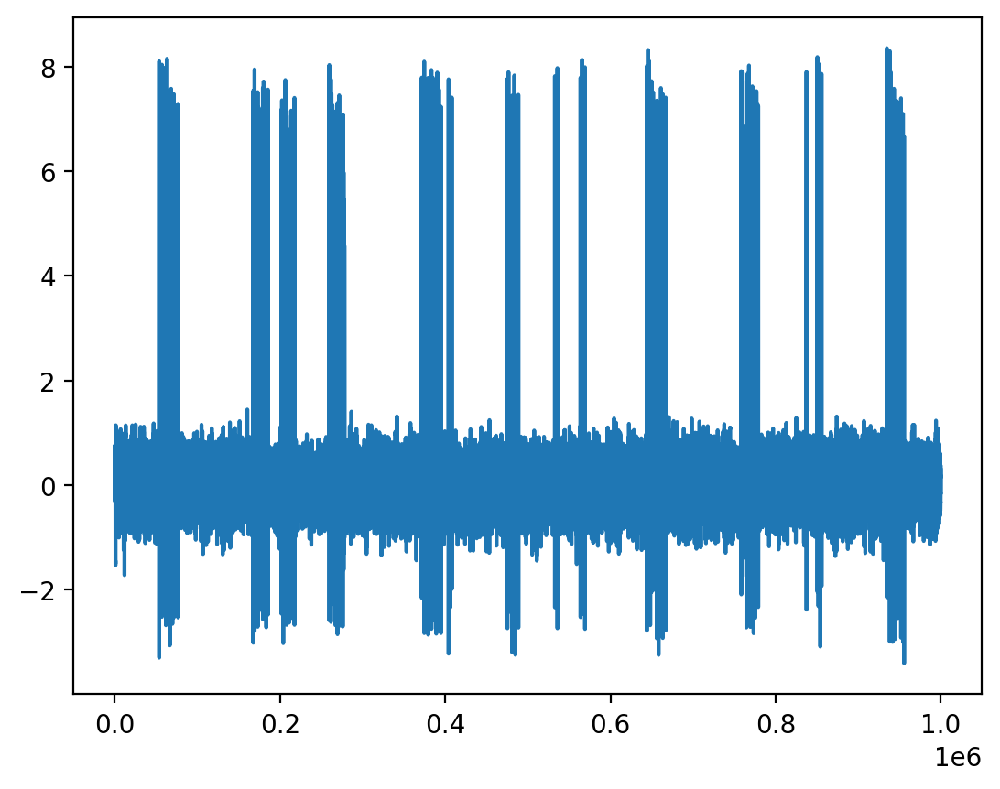

In [8]:
plt.plot(patch_filt[:1000000] )

In [9]:



#threshold in mVs
sp = Spike(thresh_amp=4, window_length=(5., 5.), smooth_frac=.01)

In [10]:
#CHANGE FOR EACH CELL
sp.fit(patch_filt, patch_fs, n_jobs=-1, progress=tqdm, flip_signal=False)

Spike:   0%|          | 0/12561 [00:00<?, ?it/s]

Spike:   0%|          | 1/12561 [00:07<27:48:39,  7.97s/it]

Spike:   0%|          | 2/12561 [00:08<13:29:57,  3.87s/it]

Spike:   0%|          | 7/12561 [00:09<2:42:47,  1.29it/s] 

Spike:   0%|          | 43/12561 [00:09<18:06, 11.52it/s] 

Spike:   0%|          | 55/12561 [00:09<13:44, 15.17it/s]

Spike:   1%|          | 65/12561 [00:09<11:03, 18.83it/s]

Spike:   1%|          | 77/12561 [00:09<08:23, 24.78it/s]

Spike:   1%|          | 87/12561 [00:09<06:43, 30.93it/s]

Spike:   1%|          | 96/12561 [00:10<05:47, 35.92it/s]

Spike:   1%|          | 105/12561 [00:10<05:02, 41.23it/s]

Spike:   1%|          | 113/12561 [00:10<04:41, 44.29it/s]

Spike:   1%|          | 121/12561 [00:10<04:24, 47.06it/s]

Spike:   1%|          | 132/12561 [00:10<03:33, 58.35it/s]

Spike:   1%|          | 140/12561 [00:10<03:46, 54.74it/s]

Spike:   1%|          | 152/12561 [00:10<03:14, 63.66it/s]

Spike:   1%|▏         | 160/12561 [00:11<03:24, 60.65it/s]

Spike:   1%|▏         | 172/12561 [00:11<03:01, 68.17it/s]

Spike:   1%|▏         | 180/12561 [00:11<03:13, 64.05it/s]

Spike:   1%|▏         | 187/12561 [00:11<05:37, 36.71it/s]

Spike:   2%|▏         | 214/12561 [00:11<02:51, 71.99it/s]

Spike:   2%|▏         | 226/12561 [00:12<03:04, 66.98it/s]

Spike:   2%|▏         | 236/12561 [00:12<03:15, 63.20it/s]

Spike:   2%|▏         | 245/12561 [00:12<03:27, 59.33it/s]

Spike:   2%|▏         | 253/12561 [00:12<03:23, 60.35it/s]

Spike:   2%|▏         | 262/12561 [00:12<03:09, 64.91it/s]

Spike:   2%|▏         | 270/12561 [00:12<03:26, 59.39it/s]

Spike:   2%|▏         | 278/12561 [00:12<03:16, 62.64it/s]

Spike:   2%|▏         | 287/12561 [00:13<03:09, 64.93it/s]

Spike:   2%|▏         | 294/12561 [00:13<04:01, 50.82it/s]

Spike:   2%|▏         | 300/12561 [00:13<03:58, 51.38it/s]

Spike:   2%|▏         | 308/12561 [00:13<03:33, 57.35it/s]

Spike:   3%|▎         | 315/12561 [00:13<03:27, 58.98it/s]

Spike:   3%|▎         | 325/12561 [00:13<03:17, 61.90it/s]

Spike:   3%|▎         | 332/12561 [00:13<03:15, 62.59it/s]

Spike:   3%|▎         | 339/12561 [00:14<03:24, 59.65it/s]

Spike:   3%|▎         | 346/12561 [00:14<03:37, 56.15it/s]

Spike:   3%|▎         | 353/12561 [00:14<03:27, 58.78it/s]

Spike:   3%|▎         | 361/12561 [00:14<03:27, 58.76it/s]

Spike:   3%|▎         | 367/12561 [00:14<03:46, 53.76it/s]

Spike:   3%|▎         | 373/12561 [00:14<04:00, 50.70it/s]

Spike:   3%|▎         | 379/12561 [00:14<05:00, 40.57it/s]

Spike:   3%|▎         | 384/12561 [00:15<08:31, 23.83it/s]

Spike:   3%|▎         | 391/12561 [00:15<06:57, 29.14it/s]

Spike:   3%|▎         | 403/12561 [00:15<04:44, 42.70it/s]

Spike:   3%|▎         | 409/12561 [00:15<04:38, 43.56it/s]

Spike:   3%|▎         | 415/12561 [00:15<04:43, 42.79it/s]

Spike:   3%|▎         | 429/12561 [00:16<03:53, 52.04it/s]

Spike:   3%|▎         | 437/12561 [00:16<03:51, 52.29it/s]

Spike:   4%|▎         | 443/12561 [00:16<03:50, 52.55it/s]

Spike:   4%|▎         | 449/12561 [00:16<03:48, 52.99it/s]

Spike:   4%|▎         | 456/12561 [00:16<03:47, 53.17it/s]

Spike:   4%|▎         | 463/12561 [00:16<04:05, 49.25it/s]

Spike:   4%|▎         | 469/12561 [00:16<04:21, 46.22it/s]

Spike:   4%|▍         | 474/12561 [00:17<04:49, 41.75it/s]

Spike:   4%|▍         | 479/12561 [00:17<04:51, 41.42it/s]

Spike:   4%|▍         | 484/12561 [00:17<05:25, 37.05it/s]

Spike:   4%|▍         | 488/12561 [00:17<06:14, 32.26it/s]

Spike:   4%|▍         | 495/12561 [00:17<06:11, 32.48it/s]

Spike:   4%|▍         | 504/12561 [00:17<04:54, 40.89it/s]

Spike:   4%|▍         | 509/12561 [00:18<05:00, 40.11it/s]

Spike:   4%|▍         | 518/12561 [00:18<03:59, 50.33it/s]

Spike:   4%|▍         | 524/12561 [00:18<08:13, 24.40it/s]

Spike:   4%|▍         | 529/12561 [00:18<07:46, 25.78it/s]

Spike:   4%|▍         | 535/12561 [00:19<06:35, 30.43it/s]

Spike:   4%|▍         | 540/12561 [00:19<06:15, 32.03it/s]

Spike:   4%|▍         | 546/12561 [00:19<05:33, 36.03it/s]

Spike:   4%|▍         | 554/12561 [00:19<04:37, 43.25it/s]

Spike:   4%|▍         | 562/12561 [00:19<04:28, 44.69it/s]

Spike:   5%|▍         | 571/12561 [00:19<03:51, 51.74it/s]

Spike:   5%|▍         | 579/12561 [00:19<03:56, 50.58it/s]

Spike:   5%|▍         | 587/12561 [00:20<03:50, 52.00it/s]

Spike:   5%|▍         | 595/12561 [00:20<03:32, 56.28it/s]

Spike:   5%|▍         | 602/12561 [00:20<03:29, 57.13it/s]

Spike:   5%|▍         | 610/12561 [00:20<03:51, 51.73it/s]

Spike:   5%|▍         | 616/12561 [00:20<03:49, 52.07it/s]

Spike:   5%|▍         | 623/12561 [00:20<04:03, 49.07it/s]

Spike:   5%|▌         | 633/12561 [00:20<03:16, 60.58it/s]

Spike:   5%|▌         | 641/12561 [00:20<03:03, 64.96it/s]

Spike:   5%|▌         | 652/12561 [00:21<02:37, 75.63it/s]

Spike:   5%|▌         | 660/12561 [00:21<02:42, 73.17it/s]

Spike:   5%|▌         | 668/12561 [00:21<02:45, 71.73it/s]

Spike:   5%|▌         | 676/12561 [00:21<02:44, 72.42it/s]

Spike:   5%|▌         | 685/12561 [00:21<02:35, 76.25it/s]

Spike:   6%|▌         | 694/12561 [00:21<02:33, 77.35it/s]

Spike:   6%|▌         | 702/12561 [00:21<02:34, 76.81it/s]

Spike:   6%|▌         | 712/12561 [00:21<02:36, 75.86it/s]

Spike:   6%|▌         | 721/12561 [00:21<02:30, 78.84it/s]

Spike:   6%|▌         | 730/12561 [00:22<02:26, 80.68it/s]

Spike:   6%|▌         | 740/12561 [00:22<02:43, 72.47it/s]

Spike:   6%|▌         | 749/12561 [00:22<02:38, 74.67it/s]

Spike:   6%|▌         | 759/12561 [00:22<02:26, 80.77it/s]

Spike:   6%|▌         | 768/12561 [00:22<02:22, 82.94it/s]

Spike:   6%|▌         | 779/12561 [00:22<02:31, 77.90it/s]

Spike:   6%|▋         | 789/12561 [00:22<02:23, 81.90it/s]

Spike:   6%|▋         | 801/12561 [00:22<02:13, 87.81it/s]

Spike:   6%|▋         | 811/12561 [00:22<02:14, 87.62it/s]

Spike:   7%|▋         | 823/12561 [00:23<02:05, 93.46it/s]

Spike:   7%|▋         | 833/12561 [00:23<02:06, 92.85it/s]

Spike:   7%|▋         | 843/12561 [00:23<02:05, 93.43it/s]

Spike:   7%|▋         | 856/12561 [00:23<01:54, 102.43it/s]

Spike:   7%|▋         | 867/12561 [00:23<02:16, 85.89it/s] 

Spike:   7%|▋         | 878/12561 [00:23<02:15, 85.99it/s]

Spike:   7%|▋         | 888/12561 [00:23<02:16, 85.83it/s]

Spike:   7%|▋         | 897/12561 [00:23<02:17, 85.09it/s]

Spike:   7%|▋         | 908/12561 [00:24<02:20, 83.00it/s]

Spike:   7%|▋         | 918/12561 [00:24<02:14, 86.89it/s]

Spike:   7%|▋         | 927/12561 [00:24<02:13, 87.38it/s]

Spike:   7%|▋         | 936/12561 [00:24<02:15, 86.09it/s]

Spike:   8%|▊         | 945/12561 [00:24<02:15, 85.69it/s]

Spike:   8%|▊         | 954/12561 [00:24<02:15, 85.37it/s]

Spike:   8%|▊         | 963/12561 [00:24<02:23, 80.81it/s]

Spike:   8%|▊         | 972/12561 [00:24<02:27, 78.33it/s]

Spike:   8%|▊         | 984/12561 [00:24<02:13, 86.74it/s]

Spike:   8%|▊         | 993/12561 [00:25<02:16, 84.77it/s]

Spike:   8%|▊         | 1002/12561 [00:25<02:37, 73.57it/s]

Spike:   8%|▊         | 1010/12561 [00:25<02:42, 70.94it/s]

Spike:   8%|▊         | 1018/12561 [00:25<02:48, 68.49it/s]

Spike:   8%|▊         | 1028/12561 [00:25<02:32, 75.57it/s]

Spike:   8%|▊         | 1037/12561 [00:25<02:30, 76.66it/s]

Spike:   8%|▊         | 1047/12561 [00:25<02:19, 82.59it/s]

Spike:   8%|▊         | 1056/12561 [00:26<03:11, 60.23it/s]

Spike:   8%|▊         | 1067/12561 [00:26<02:42, 70.78it/s]

Spike:   9%|▊         | 1076/12561 [00:26<02:49, 67.67it/s]

Spike:   9%|▊         | 1086/12561 [00:26<02:35, 73.94it/s]

Spike:   9%|▊         | 1095/12561 [00:26<02:52, 66.56it/s]

Spike:   9%|▉         | 1103/12561 [00:26<02:47, 68.57it/s]

Spike:   9%|▉         | 1117/12561 [00:26<02:13, 85.71it/s]

Spike:   9%|▉         | 1127/12561 [00:26<02:21, 80.82it/s]

Spike:   9%|▉         | 1137/12561 [00:27<02:18, 82.58it/s]

Spike:   9%|▉         | 1150/12561 [00:27<02:07, 89.38it/s]

Spike:   9%|▉         | 1160/12561 [00:27<02:14, 84.94it/s]

Spike:   9%|▉         | 1170/12561 [00:27<02:12, 86.26it/s]

Spike:   9%|▉         | 1179/12561 [00:27<02:28, 76.48it/s]

Spike:   9%|▉         | 1187/12561 [00:27<03:09, 59.93it/s]

Spike:  10%|▉         | 1194/12561 [00:27<03:20, 56.59it/s]

Spike:  10%|▉         | 1201/12561 [00:28<03:12, 59.07it/s]

Spike:  10%|▉         | 1208/12561 [00:28<03:17, 57.47it/s]

Spike:  10%|▉         | 1219/12561 [00:28<02:43, 69.16it/s]

Spike:  10%|▉         | 1227/12561 [00:28<02:37, 71.89it/s]

Spike:  10%|▉         | 1236/12561 [00:28<02:43, 69.14it/s]

Spike:  10%|▉         | 1248/12561 [00:28<02:23, 78.92it/s]

Spike:  10%|█         | 1257/12561 [00:28<02:19, 81.20it/s]

Spike:  10%|█         | 1266/12561 [00:28<02:22, 79.38it/s]

Spike:  10%|█         | 1275/12561 [00:28<02:19, 81.05it/s]

Spike:  10%|█         | 1285/12561 [00:29<02:33, 73.59it/s]

Spike:  10%|█         | 1294/12561 [00:29<02:31, 74.52it/s]

Spike:  10%|█         | 1309/12561 [00:29<02:04, 90.27it/s]

Spike:  11%|█         | 1319/12561 [00:29<02:21, 79.18it/s]

Spike:  11%|█         | 1328/12561 [00:29<03:05, 60.67it/s]

Spike:  11%|█         | 1336/12561 [00:29<02:56, 63.70it/s]

Spike:  11%|█         | 1344/12561 [00:29<02:47, 66.84it/s]

Spike:  11%|█         | 1354/12561 [00:30<02:48, 66.64it/s]

Spike:  11%|█         | 1369/12561 [00:30<02:28, 75.25it/s]

Spike:  11%|█         | 1377/12561 [00:30<02:36, 71.39it/s]

Spike:  11%|█         | 1392/12561 [00:30<02:21, 79.10it/s]

Spike:  11%|█         | 1407/12561 [00:30<01:59, 93.68it/s]

Spike:  11%|█▏        | 1417/12561 [00:30<01:57, 94.60it/s]

Spike:  11%|█▏        | 1427/12561 [00:30<01:59, 93.03it/s]

Spike:  11%|█▏        | 1439/12561 [00:31<02:01, 91.82it/s]

Spike:  12%|█▏        | 1451/12561 [00:31<01:56, 95.14it/s]

Spike:  12%|█▏        | 1461/12561 [00:31<01:58, 93.40it/s]

Spike:  12%|█▏        | 1475/12561 [00:31<01:48, 102.04it/s]

Spike:  12%|█▏        | 1486/12561 [00:31<01:55, 95.98it/s] 

Spike:  12%|█▏        | 1496/12561 [00:31<02:00, 91.47it/s]

Spike:  12%|█▏        | 1506/12561 [00:31<02:15, 81.37it/s]

Spike:  12%|█▏        | 1518/12561 [00:31<02:07, 86.50it/s]

Spike:  12%|█▏        | 1527/12561 [00:32<02:19, 79.29it/s]

Spike:  12%|█▏        | 1540/12561 [00:32<02:04, 88.17it/s]

Spike:  12%|█▏        | 1552/12561 [00:32<01:58, 92.80it/s]

Spike:  12%|█▏        | 1562/12561 [00:32<02:10, 84.21it/s]

Spike:  13%|█▎        | 1574/12561 [00:32<02:01, 90.48it/s]

Spike:  13%|█▎        | 1584/12561 [00:32<02:02, 89.60it/s]

Spike:  13%|█▎        | 1596/12561 [00:32<02:10, 83.74it/s]

Spike:  13%|█▎        | 1606/12561 [00:32<02:17, 79.70it/s]

Spike:  13%|█▎        | 1624/12561 [00:33<01:47, 101.37it/s]

Spike:  13%|█▎        | 1635/12561 [00:33<01:51, 97.57it/s] 

Spike:  13%|█▎        | 1648/12561 [00:33<01:53, 95.97it/s]

Spike:  13%|█▎        | 1660/12561 [00:33<01:58, 92.05it/s]

Spike:  13%|█▎        | 1674/12561 [00:33<01:59, 90.86it/s]

Spike:  13%|█▎        | 1689/12561 [00:33<01:46, 102.56it/s]

Spike:  14%|█▎        | 1700/12561 [00:33<01:50, 98.39it/s] 

Spike:  14%|█▎        | 1711/12561 [00:33<01:49, 99.00it/s]

Spike:  14%|█▎        | 1722/12561 [00:34<01:51, 97.04it/s]

Spike:  14%|█▍        | 1732/12561 [00:34<01:56, 93.26it/s]

Spike:  14%|█▍        | 1743/12561 [00:34<01:54, 94.85it/s]

Spike:  14%|█▍        | 1753/12561 [00:34<02:08, 84.35it/s]

Spike:  14%|█▍        | 1766/12561 [00:34<01:58, 91.10it/s]

Spike:  14%|█▍        | 1776/12561 [00:34<02:05, 86.19it/s]

Spike:  14%|█▍        | 1786/12561 [00:34<02:01, 88.47it/s]

Spike:  14%|█▍        | 1796/12561 [00:34<02:08, 83.93it/s]

Spike:  14%|█▍        | 1806/12561 [00:35<02:03, 87.19it/s]

Spike:  14%|█▍        | 1818/12561 [00:35<01:59, 89.88it/s]

Spike:  15%|█▍        | 1828/12561 [00:35<02:06, 85.03it/s]

Spike:  15%|█▍        | 1841/12561 [00:35<01:56, 92.14it/s]

Spike:  15%|█▍        | 1851/12561 [00:35<01:58, 90.71it/s]

Spike:  15%|█▍        | 1863/12561 [00:35<01:51, 95.93it/s]

Spike:  15%|█▍        | 1874/12561 [00:35<01:47, 99.55it/s]

Spike:  15%|█▌        | 1885/12561 [00:35<01:51, 95.37it/s]

Spike:  15%|█▌        | 1897/12561 [00:36<02:00, 88.15it/s]

Spike:  15%|█▌        | 1911/12561 [00:36<01:55, 91.96it/s]

Spike:  15%|█▌        | 1923/12561 [00:36<01:55, 92.18it/s]

Spike:  15%|█▌        | 1935/12561 [00:36<01:55, 92.35it/s]

Spike:  16%|█▌        | 1947/12561 [00:36<01:52, 94.08it/s]

Spike:  16%|█▌        | 1960/12561 [00:36<01:57, 89.96it/s]

Spike:  16%|█▌        | 1970/12561 [00:36<01:55, 91.54it/s]

Spike:  16%|█▌        | 1982/12561 [00:36<01:51, 94.48it/s]

Spike:  16%|█▌        | 1994/12561 [00:37<01:45, 100.08it/s]

Spike:  16%|█▌        | 2005/12561 [00:37<01:43, 101.56it/s]

Spike:  16%|█▌        | 2016/12561 [00:37<01:45, 100.33it/s]

Spike:  16%|█▌        | 2027/12561 [00:37<01:51, 94.28it/s] 

Spike:  16%|█▌        | 2037/12561 [00:37<01:50, 94.99it/s]

Spike:  16%|█▋        | 2047/12561 [00:37<01:53, 92.29it/s]

Spike:  16%|█▋        | 2057/12561 [00:37<01:56, 89.82it/s]

Spike:  16%|█▋        | 2067/12561 [00:37<02:01, 86.72it/s]

Spike:  17%|█▋        | 2077/12561 [00:37<01:56, 90.05it/s]

Spike:  17%|█▋        | 2087/12561 [00:38<01:55, 90.99it/s]

Spike:  17%|█▋        | 2097/12561 [00:38<01:55, 90.86it/s]

Spike:  17%|█▋        | 2107/12561 [00:38<01:52, 93.33it/s]

Spike:  17%|█▋        | 2117/12561 [00:38<02:03, 84.47it/s]

Spike:  17%|█▋        | 2131/12561 [00:38<01:46, 97.48it/s]

Spike:  17%|█▋        | 2141/12561 [00:38<02:01, 85.61it/s]

Spike:  17%|█▋        | 2155/12561 [00:38<01:48, 95.75it/s]

Spike:  17%|█▋        | 2167/12561 [00:38<01:45, 98.23it/s]

Spike:  17%|█▋        | 2178/12561 [00:39<01:52, 92.12it/s]

Spike:  17%|█▋        | 2188/12561 [00:39<01:54, 90.92it/s]

Spike:  17%|█▋        | 2198/12561 [00:39<02:09, 79.92it/s]

Spike:  18%|█▊        | 2209/12561 [00:39<02:01, 84.85it/s]

Spike:  18%|█▊        | 2218/12561 [00:39<02:05, 82.34it/s]

Spike:  18%|█▊        | 2230/12561 [00:39<01:53, 90.63it/s]

Spike:  18%|█▊        | 2240/12561 [00:39<02:00, 85.93it/s]

Spike:  18%|█▊        | 2249/12561 [00:39<02:00, 85.57it/s]

Spike:  18%|█▊        | 2258/12561 [00:40<03:49, 44.91it/s]

Spike:  18%|█▊        | 2272/12561 [00:40<02:50, 60.37it/s]

Spike:  18%|█▊        | 2286/12561 [00:40<02:18, 74.02it/s]

Spike:  18%|█▊        | 2301/12561 [00:40<02:00, 85.29it/s]

Spike:  18%|█▊        | 2313/12561 [00:40<01:50, 92.52it/s]

Spike:  19%|█▊        | 2328/12561 [00:40<01:37, 105.11it/s]

Spike:  19%|█▊        | 2345/12561 [00:41<01:28, 114.88it/s]

Spike:  19%|█▉        | 2360/12561 [00:41<01:25, 119.39it/s]

Spike:  19%|█▉        | 2374/12561 [00:41<01:24, 121.10it/s]

Spike:  19%|█▉        | 2387/12561 [00:41<01:22, 123.32it/s]

Spike:  19%|█▉        | 2400/12561 [00:41<01:22, 122.49it/s]

Spike:  19%|█▉        | 2414/12561 [00:41<01:23, 121.68it/s]

Spike:  19%|█▉        | 2427/12561 [00:41<01:30, 112.47it/s]

Spike:  19%|█▉        | 2442/12561 [00:41<01:30, 111.25it/s]

Spike:  20%|█▉        | 2458/12561 [00:41<01:23, 120.90it/s]

Spike:  20%|█▉        | 2471/12561 [00:42<01:23, 121.08it/s]

Spike:  20%|█▉        | 2487/12561 [00:42<01:16, 131.09it/s]

Spike:  20%|█▉        | 2501/12561 [00:42<01:16, 131.15it/s]

Spike:  20%|██        | 2515/12561 [00:42<01:15, 132.47it/s]

Spike:  20%|██        | 2529/12561 [00:42<01:16, 131.15it/s]

Spike:  20%|██        | 2543/12561 [00:42<01:38, 101.43it/s]

Spike:  20%|██        | 2555/12561 [00:42<01:47, 93.01it/s] 

Spike:  20%|██        | 2566/12561 [00:43<01:44, 95.48it/s]

Spike:  21%|██        | 2580/12561 [00:43<01:35, 104.30it/s]

Spike:  21%|██        | 2595/12561 [00:43<01:28, 113.18it/s]

Spike:  21%|██        | 2612/12561 [00:43<01:18, 126.02it/s]

Spike:  21%|██        | 2628/12561 [00:43<01:13, 134.32it/s]

Spike:  21%|██        | 2642/12561 [00:43<01:15, 131.71it/s]

Spike:  21%|██        | 2662/12561 [00:43<01:06, 149.63it/s]

Spike:  21%|██▏       | 2678/12561 [00:43<01:05, 150.57it/s]

Spike:  21%|██▏       | 2694/12561 [00:43<01:13, 135.10it/s]

Spike:  22%|██▏       | 2715/12561 [00:44<01:05, 151.10it/s]

Spike:  22%|██▏       | 2731/12561 [00:44<01:05, 150.36it/s]

Spike:  22%|██▏       | 2747/12561 [00:44<01:23, 117.12it/s]

Spike:  22%|██▏       | 2761/12561 [00:44<01:20, 121.84it/s]

Spike:  22%|██▏       | 2778/12561 [00:44<01:16, 128.69it/s]

Spike:  22%|██▏       | 2795/12561 [00:44<01:10, 138.23it/s]

Spike:  22%|██▏       | 2810/12561 [00:44<01:11, 136.66it/s]

Spike:  23%|██▎       | 2830/12561 [00:44<01:04, 150.79it/s]

Spike:  23%|██▎       | 2846/12561 [00:44<01:05, 147.26it/s]

Spike:  23%|██▎       | 2862/12561 [00:45<01:04, 150.08it/s]

Spike:  23%|██▎       | 2882/12561 [00:45<01:00, 159.02it/s]

Spike:  23%|██▎       | 2901/12561 [00:45<00:59, 163.56it/s]

Spike:  23%|██▎       | 2918/12561 [00:45<00:59, 162.14it/s]

Spike:  23%|██▎       | 2937/12561 [00:45<00:57, 166.51it/s]

Spike:  24%|██▎       | 2956/12561 [00:45<00:59, 161.82it/s]

Spike:  24%|██▎       | 2973/12561 [00:45<01:02, 153.76it/s]

Spike:  24%|██▍       | 2995/12561 [00:45<00:57, 165.49it/s]

Spike:  24%|██▍       | 3015/12561 [00:45<00:56, 170.15it/s]

Spike:  24%|██▍       | 3035/12561 [00:46<00:53, 176.49it/s]

Spike:  24%|██▍       | 3053/12561 [00:46<00:57, 164.07it/s]

Spike:  24%|██▍       | 3070/12561 [00:46<00:58, 161.02it/s]

Spike:  25%|██▍       | 3087/12561 [00:46<00:58, 160.88it/s]

Spike:  25%|██▍       | 3104/12561 [00:46<00:59, 159.09it/s]

Spike:  25%|██▍       | 3120/12561 [00:46<01:03, 149.37it/s]

Spike:  25%|██▍       | 3138/12561 [00:46<00:59, 157.23it/s]

Spike:  25%|██▌       | 3156/12561 [00:46<01:03, 147.31it/s]

Spike:  25%|██▌       | 3179/12561 [00:47<00:56, 164.94it/s]

Spike:  25%|██▌       | 3196/12561 [00:47<01:00, 155.03it/s]

Spike:  26%|██▌       | 3213/12561 [00:47<00:59, 157.70it/s]

Spike:  26%|██▌       | 3233/12561 [00:47<00:58, 159.36it/s]

Spike:  26%|██▌       | 3255/12561 [00:47<00:53, 174.90it/s]

Spike:  26%|██▌       | 3273/12561 [00:47<00:55, 167.62it/s]

Spike:  26%|██▌       | 3290/12561 [00:47<00:56, 164.36it/s]

Spike:  26%|██▋       | 3310/12561 [00:47<00:54, 169.26it/s]

Spike:  26%|██▋       | 3328/12561 [00:47<00:55, 165.85it/s]

Spike:  27%|██▋       | 3345/12561 [00:48<00:55, 164.87it/s]

Spike:  27%|██▋       | 3362/12561 [00:48<00:56, 162.93it/s]

Spike:  27%|██▋       | 3379/12561 [00:48<00:56, 162.33it/s]

Spike:  27%|██▋       | 3398/12561 [00:48<00:54, 168.95it/s]

Spike:  27%|██▋       | 3417/12561 [00:48<00:54, 166.37it/s]

Spike:  27%|██▋       | 3435/12561 [00:48<00:55, 165.75it/s]

Spike:  27%|██▋       | 3452/12561 [00:48<00:55, 164.11it/s]

Spike:  28%|██▊       | 3471/12561 [00:48<00:53, 169.53it/s]

Spike:  28%|██▊       | 3491/12561 [00:48<00:53, 170.00it/s]

Spike:  28%|██▊       | 3510/12561 [00:49<00:51, 175.22it/s]

Spike:  28%|██▊       | 3528/12561 [00:49<00:53, 168.86it/s]

Spike:  28%|██▊       | 3545/12561 [00:49<00:56, 158.96it/s]

Spike:  28%|██▊       | 3562/12561 [00:49<01:05, 137.54it/s]

Spike:  29%|██▊       | 3581/12561 [00:49<01:01, 147.02it/s]

Spike:  29%|██▊       | 3599/12561 [00:49<00:58, 152.60it/s]

Spike:  29%|██▉       | 3616/12561 [00:49<00:59, 151.31it/s]

Spike:  29%|██▉       | 3633/12561 [00:49<00:57, 155.05it/s]

Spike:  29%|██▉       | 3649/12561 [00:49<00:57, 154.99it/s]

Spike:  29%|██▉       | 3665/12561 [00:50<00:56, 156.30it/s]

Spike:  29%|██▉       | 3681/12561 [00:50<00:58, 151.28it/s]

Spike:  29%|██▉       | 3697/12561 [00:50<00:57, 152.94it/s]

Spike:  30%|██▉       | 3715/12561 [00:50<00:58, 151.61it/s]

Spike:  30%|██▉       | 3734/12561 [00:50<00:55, 158.55it/s]

Spike:  30%|██▉       | 3752/12561 [00:50<00:55, 158.68it/s]

Spike:  30%|███       | 3769/12561 [00:50<00:59, 147.53it/s]

Spike:  30%|███       | 3793/12561 [00:50<01:02, 140.96it/s]

Spike:  30%|███       | 3821/12561 [00:51<00:51, 169.70it/s]

Spike:  31%|███       | 3839/12561 [00:51<00:55, 156.46it/s]

Spike:  31%|███       | 3862/12561 [00:51<00:52, 166.41it/s]

Spike:  31%|███       | 3880/12561 [00:51<00:53, 163.06it/s]

Spike:  31%|███       | 3897/12561 [00:51<00:53, 162.13it/s]

Spike:  31%|███       | 3914/12561 [00:51<00:54, 158.56it/s]

Spike:  31%|███▏      | 3933/12561 [00:51<00:53, 160.42it/s]

Spike:  31%|███▏      | 3950/12561 [00:51<00:56, 152.98it/s]

Spike:  32%|███▏      | 3967/12561 [00:51<00:55, 155.06it/s]

Spike:  32%|███▏      | 3983/12561 [00:52<00:58, 146.09it/s]

Spike:  32%|███▏      | 3998/12561 [00:52<00:58, 147.11it/s]

Spike:  32%|███▏      | 4013/12561 [00:52<01:00, 140.88it/s]

Spike:  32%|███▏      | 4028/12561 [00:52<01:02, 137.18it/s]

Spike:  32%|███▏      | 4044/12561 [00:52<00:59, 143.12it/s]

Spike:  32%|███▏      | 4060/12561 [00:52<00:58, 144.56it/s]

Spike:  32%|███▏      | 4077/12561 [00:52<00:57, 148.78it/s]

Spike:  33%|███▎      | 4092/12561 [00:52<00:56, 148.99it/s]

Spike:  33%|███▎      | 4109/12561 [00:52<00:56, 150.29it/s]

Spike:  33%|███▎      | 4125/12561 [00:53<00:58, 144.49it/s]

Spike:  33%|███▎      | 4141/12561 [00:53<00:58, 144.90it/s]

Spike:  33%|███▎      | 4156/12561 [00:53<01:02, 133.71it/s]

Spike:  33%|███▎      | 4170/12561 [00:53<01:12, 116.05it/s]

Spike:  33%|███▎      | 4183/12561 [00:53<01:13, 113.41it/s]

Spike:  33%|███▎      | 4196/12561 [00:53<01:11, 116.58it/s]

Spike:  34%|███▎      | 4209/12561 [00:53<01:10, 119.19it/s]

Spike:  34%|███▎      | 4222/12561 [00:53<01:12, 114.97it/s]

Spike:  34%|███▎      | 4237/12561 [00:54<01:10, 118.19it/s]

Spike:  34%|███▍      | 4249/12561 [00:54<01:16, 108.23it/s]

Spike:  34%|███▍      | 4261/12561 [00:54<01:38, 84.69it/s] 

Spike:  34%|███▍      | 4277/12561 [00:54<01:22, 100.52it/s]

Spike:  34%|███▍      | 4290/12561 [00:54<01:18, 106.02it/s]

Spike:  34%|███▍      | 4304/12561 [00:54<01:14, 110.53it/s]

Spike:  34%|███▍      | 4322/12561 [00:54<01:05, 126.45it/s]

Spike:  35%|███▍      | 4336/12561 [00:54<01:04, 127.57it/s]

Spike:  35%|███▍      | 4354/12561 [00:55<00:58, 140.55it/s]

Spike:  35%|███▍      | 4372/12561 [00:55<00:56, 145.12it/s]

Spike:  35%|███▍      | 4390/12561 [00:55<00:52, 154.55it/s]

Spike:  35%|███▌      | 4406/12561 [00:55<00:53, 152.56it/s]

Spike:  35%|███▌      | 4423/12561 [00:55<00:54, 149.30it/s]

Spike:  35%|███▌      | 4439/12561 [00:55<01:01, 132.84it/s]

Spike:  35%|███▌      | 4453/12561 [00:55<01:02, 128.73it/s]

Spike:  36%|███▌      | 4468/12561 [00:55<01:00, 132.88it/s]

Spike:  36%|███▌      | 4486/12561 [00:55<00:56, 141.74it/s]

Spike:  36%|███▌      | 4507/12561 [00:56<00:53, 151.85it/s]

Spike:  36%|███▌      | 4526/12561 [00:56<00:49, 160.95it/s]

Spike:  36%|███▌      | 4543/12561 [00:56<00:54, 147.64it/s]

Spike:  36%|███▋      | 4559/12561 [00:56<00:56, 141.06it/s]

Spike:  36%|███▋      | 4578/12561 [00:56<00:54, 147.83it/s]

Spike:  37%|███▋      | 4597/12561 [00:56<00:52, 152.92it/s]

Spike:  37%|███▋      | 4613/12561 [00:56<00:53, 147.49it/s]

Spike:  37%|███▋      | 4630/12561 [00:56<00:52, 151.84it/s]

Spike:  37%|███▋      | 4648/12561 [00:57<00:50, 155.32it/s]

Spike:  37%|███▋      | 4667/12561 [00:57<00:48, 161.19it/s]

Spike:  37%|███▋      | 4684/12561 [00:57<00:51, 154.35it/s]

Spike:  37%|███▋      | 4702/12561 [00:57<00:48, 160.53it/s]

Spike:  38%|███▊      | 4719/12561 [00:57<00:48, 161.93it/s]

Spike:  38%|███▊      | 4736/12561 [00:57<00:49, 157.56it/s]

Spike:  38%|███▊      | 4756/12561 [00:57<00:48, 161.78it/s]

Spike:  38%|███▊      | 4773/12561 [00:57<00:50, 155.31it/s]

Spike:  38%|███▊      | 4795/12561 [00:57<00:48, 160.96it/s]

Spike:  38%|███▊      | 4813/12561 [00:58<00:47, 164.10it/s]

Spike:  38%|███▊      | 4830/12561 [00:58<00:47, 163.91it/s]

Spike:  39%|███▊      | 4847/12561 [00:58<00:48, 159.13it/s]

Spike:  39%|███▉      | 4868/12561 [00:58<00:45, 169.06it/s]

Spike:  39%|███▉      | 4888/12561 [00:58<00:45, 169.55it/s]

Spike:  39%|███▉      | 4905/12561 [00:58<00:49, 156.09it/s]

Spike:  39%|███▉      | 4924/12561 [00:58<00:47, 162.24it/s]

Spike:  39%|███▉      | 4942/12561 [00:58<00:46, 163.27it/s]

Spike:  39%|███▉      | 4959/12561 [00:58<00:48, 157.86it/s]

Spike:  40%|███▉      | 4978/12561 [00:59<00:47, 160.89it/s]

Spike:  40%|███▉      | 4995/12561 [00:59<00:46, 162.02it/s]

Spike:  40%|███▉      | 5012/12561 [00:59<00:48, 154.32it/s]

Spike:  40%|████      | 5028/12561 [00:59<00:50, 150.10it/s]

Spike:  40%|████      | 5044/12561 [00:59<00:49, 152.20it/s]

Spike:  40%|████      | 5060/12561 [00:59<00:50, 148.52it/s]

Spike:  40%|████      | 5077/12561 [00:59<00:49, 150.38it/s]

Spike:  41%|████      | 5095/12561 [00:59<00:47, 156.18it/s]

Spike:  41%|████      | 5114/12561 [00:59<00:45, 163.00it/s]

Spike:  41%|████      | 5131/12561 [01:00<00:47, 155.48it/s]

Spike:  41%|████      | 5147/12561 [01:00<00:47, 154.49it/s]

Spike:  41%|████      | 5165/12561 [01:00<00:46, 159.46it/s]

Spike:  41%|████▏     | 5182/12561 [01:00<00:46, 160.36it/s]

Spike:  41%|████▏     | 5199/12561 [01:00<00:46, 159.99it/s]

Spike:  42%|████▏     | 5216/12561 [01:00<00:45, 160.96it/s]

Spike:  42%|████▏     | 5233/12561 [01:00<00:45, 160.33it/s]

Spike:  42%|████▏     | 5250/12561 [01:00<00:44, 162.79it/s]

Spike:  42%|████▏     | 5268/12561 [01:00<00:44, 164.11it/s]

Spike:  42%|████▏     | 5288/12561 [01:01<00:42, 172.04it/s]

Spike:  42%|████▏     | 5306/12561 [01:01<00:46, 156.90it/s]

Spike:  42%|████▏     | 5323/12561 [01:01<00:45, 157.68it/s]

Spike:  43%|████▎     | 5340/12561 [01:01<00:47, 152.45it/s]

Spike:  43%|████▎     | 5359/12561 [01:01<00:45, 158.32it/s]

Spike:  43%|████▎     | 5383/12561 [01:01<00:42, 167.72it/s]

Spike:  43%|████▎     | 5404/12561 [01:01<00:41, 173.86it/s]

Spike:  43%|████▎     | 5422/12561 [01:01<00:43, 165.84it/s]

Spike:  43%|████▎     | 5443/12561 [01:02<00:45, 157.81it/s]

Spike:  43%|████▎     | 5461/12561 [01:02<00:43, 162.27it/s]

Spike:  44%|████▎     | 5481/12561 [01:02<00:42, 166.01it/s]

Spike:  44%|████▍     | 5498/12561 [01:02<00:42, 165.82it/s]

Spike:  44%|████▍     | 5515/12561 [01:02<00:42, 165.08it/s]

Spike:  44%|████▍     | 5532/12561 [01:02<00:42, 166.32it/s]

Spike:  44%|████▍     | 5550/12561 [01:02<00:42, 163.57it/s]

Spike:  44%|████▍     | 5570/12561 [01:02<00:41, 169.02it/s]

Spike:  44%|████▍     | 5587/12561 [01:02<00:44, 156.86it/s]

Spike:  45%|████▍     | 5610/12561 [01:02<00:40, 170.23it/s]

Spike:  45%|████▍     | 5628/12561 [01:03<00:40, 172.13it/s]

Spike:  45%|████▍     | 5646/12561 [01:03<00:41, 168.54it/s]

Spike:  45%|████▌     | 5663/12561 [01:03<00:40, 168.44it/s]

Spike:  45%|████▌     | 5680/12561 [01:03<00:40, 168.73it/s]

Spike:  45%|████▌     | 5698/12561 [01:03<00:42, 161.13it/s]

Spike:  46%|████▌     | 5717/12561 [01:03<00:40, 169.04it/s]

Spike:  46%|████▌     | 5735/12561 [01:03<00:41, 163.36it/s]

Spike:  46%|████▌     | 5752/12561 [01:03<00:43, 158.19it/s]

Spike:  46%|████▌     | 5774/12561 [01:03<00:39, 170.15it/s]

Spike:  46%|████▌     | 5792/12561 [01:04<00:40, 166.15it/s]

Spike:  46%|████▌     | 5809/12561 [01:04<00:43, 154.53it/s]

Spike:  46%|████▋     | 5825/12561 [01:04<00:45, 147.98it/s]

Spike:  47%|████▋     | 5842/12561 [01:04<00:44, 150.52it/s]

Spike:  47%|████▋     | 5858/12561 [01:04<00:46, 145.48it/s]

Spike:  47%|████▋     | 5873/12561 [01:04<00:46, 145.04it/s]

Spike:  47%|████▋     | 5890/12561 [01:04<00:46, 143.79it/s]

Spike:  47%|████▋     | 5905/12561 [01:04<00:45, 145.39it/s]

Spike:  47%|████▋     | 5923/12561 [01:05<00:44, 150.38it/s]

Spike:  47%|████▋     | 5939/12561 [01:05<00:46, 142.61it/s]

Spike:  47%|████▋     | 5962/12561 [01:05<00:41, 160.37it/s]

Spike:  48%|████▊     | 5979/12561 [01:05<00:41, 159.82it/s]

Spike:  48%|████▊     | 5996/12561 [01:05<00:40, 161.15it/s]

Spike:  48%|████▊     | 6013/12561 [01:05<00:41, 157.52it/s]

Spike:  48%|████▊     | 6033/12561 [01:05<00:38, 168.64it/s]

Spike:  48%|████▊     | 6051/12561 [01:05<00:38, 169.60it/s]

Spike:  48%|████▊     | 6069/12561 [01:05<00:40, 160.67it/s]

Spike:  48%|████▊     | 6086/12561 [01:06<00:40, 158.93it/s]

Spike:  49%|████▊     | 6105/12561 [01:06<00:38, 166.48it/s]

Spike:  49%|████▊     | 6123/12561 [01:06<00:38, 167.01it/s]

Spike:  49%|████▉     | 6140/12561 [01:06<00:39, 160.76it/s]

Spike:  49%|████▉     | 6159/12561 [01:06<00:37, 168.69it/s]

Spike:  49%|████▉     | 6176/12561 [01:06<00:40, 158.07it/s]

Spike:  49%|████▉     | 6195/12561 [01:06<00:39, 160.76it/s]

Spike:  49%|████▉     | 6213/12561 [01:06<00:40, 155.94it/s]

Spike:  50%|████▉     | 6234/12561 [01:06<00:37, 167.03it/s]

Spike:  50%|████▉     | 6251/12561 [01:07<00:39, 158.44it/s]

Spike:  50%|████▉     | 6269/12561 [01:07<00:40, 154.80it/s]

Spike:  50%|█████     | 6291/12561 [01:07<00:37, 168.78it/s]

Spike:  50%|█████     | 6309/12561 [01:07<00:39, 159.02it/s]

Spike:  50%|█████     | 6334/12561 [01:07<00:36, 171.08it/s]

Spike:  51%|█████     | 6352/12561 [01:07<00:38, 163.26it/s]

Spike:  51%|█████     | 6374/12561 [01:07<00:35, 175.50it/s]

Spike:  51%|█████     | 6393/12561 [01:07<00:35, 173.62it/s]

Spike:  51%|█████     | 6411/12561 [01:07<00:37, 165.11it/s]

Spike:  51%|█████     | 6428/12561 [01:08<00:42, 145.98it/s]

Spike:  51%|█████▏    | 6448/12561 [01:08<00:38, 157.25it/s]

Spike:  51%|█████▏    | 6468/12561 [01:08<00:37, 161.60it/s]

Spike:  52%|█████▏    | 6488/12561 [01:08<00:36, 168.56it/s]

Spike:  52%|█████▏    | 6506/12561 [01:08<00:39, 152.46it/s]

Spike:  52%|█████▏    | 6529/12561 [01:08<00:36, 164.14it/s]

Spike:  52%|█████▏    | 6548/12561 [01:08<00:35, 168.21it/s]

Spike:  52%|█████▏    | 6566/12561 [01:08<00:35, 169.01it/s]

Spike:  52%|█████▏    | 6584/12561 [01:09<00:36, 163.45it/s]

Spike:  53%|█████▎    | 6601/12561 [01:09<00:36, 162.67it/s]

Spike:  53%|█████▎    | 6618/12561 [01:09<00:37, 158.84it/s]

Spike:  53%|█████▎    | 6634/12561 [01:09<00:38, 154.02it/s]

Spike:  53%|█████▎    | 6652/12561 [01:09<00:37, 158.49it/s]

Spike:  53%|█████▎    | 6668/12561 [01:09<00:41, 142.32it/s]

Spike:  53%|█████▎    | 6687/12561 [01:09<00:37, 154.69it/s]

Spike:  53%|█████▎    | 6704/12561 [01:09<00:36, 158.58it/s]

Spike:  54%|█████▎    | 6722/12561 [01:09<00:36, 160.68it/s]

Spike:  54%|█████▎    | 6739/12561 [01:10<00:38, 150.13it/s]

Spike:  54%|█████▍    | 6756/12561 [01:10<00:38, 152.38it/s]

Spike:  54%|█████▍    | 6774/12561 [01:10<00:36, 158.70it/s]

Spike:  54%|█████▍    | 6792/12561 [01:10<00:35, 164.59it/s]

Spike:  54%|█████▍    | 6809/12561 [01:10<00:37, 151.89it/s]

Spike:  54%|█████▍    | 6832/12561 [01:10<00:35, 161.33it/s]

Spike:  55%|█████▍    | 6849/12561 [01:10<00:35, 162.79it/s]

Spike:  55%|█████▍    | 6869/12561 [01:10<00:34, 167.37it/s]

Spike:  55%|█████▍    | 6886/12561 [01:10<00:34, 165.09it/s]

Spike:  55%|█████▍    | 6906/12561 [01:11<00:33, 169.38it/s]

Spike:  55%|█████▌    | 6923/12561 [01:11<00:33, 166.62it/s]

Spike:  55%|█████▌    | 6940/12561 [01:11<00:33, 165.57it/s]

Spike:  55%|█████▌    | 6957/12561 [01:11<00:35, 158.83it/s]

Spike:  56%|█████▌    | 6979/12561 [01:11<00:32, 173.82it/s]

Spike:  56%|█████▌    | 6997/12561 [01:11<00:34, 162.66it/s]

Spike:  56%|█████▌    | 7016/12561 [01:11<00:33, 165.50it/s]

Spike:  56%|█████▌    | 7035/12561 [01:11<00:32, 169.54it/s]

Spike:  56%|█████▌    | 7053/12561 [01:11<00:32, 168.85it/s]

Spike:  56%|█████▋    | 7071/12561 [01:12<00:32, 166.61it/s]

Spike:  56%|█████▋    | 7089/12561 [01:12<00:32, 166.05it/s]

Spike:  57%|█████▋    | 7107/12561 [01:12<00:32, 167.31it/s]

Spike:  57%|█████▋    | 7125/12561 [01:12<00:32, 167.13it/s]

Spike:  57%|█████▋    | 7143/12561 [01:12<00:32, 164.63it/s]

Spike:  57%|█████▋    | 7163/12561 [01:12<00:31, 169.87it/s]

Spike:  57%|█████▋    | 7181/12561 [01:12<00:33, 161.70it/s]

Spike:  57%|█████▋    | 7202/12561 [01:12<00:32, 166.96it/s]

Spike:  57%|█████▋    | 7219/12561 [01:12<00:32, 164.03it/s]

Spike:  58%|█████▊    | 7237/12561 [01:13<00:32, 163.91it/s]

Spike:  58%|█████▊    | 7254/12561 [01:13<00:32, 161.46it/s]

Spike:  58%|█████▊    | 7271/12561 [01:13<00:32, 161.25it/s]

Spike:  58%|█████▊    | 7289/12561 [01:13<00:32, 164.10it/s]

Spike:  58%|█████▊    | 7308/12561 [01:13<00:32, 160.85it/s]

Spike:  58%|█████▊    | 7325/12561 [01:13<00:32, 160.07it/s]

Spike:  58%|█████▊    | 7342/12561 [01:13<00:32, 162.54it/s]

Spike:  59%|█████▊    | 7360/12561 [01:13<00:31, 167.41it/s]

Spike:  59%|█████▊    | 7379/12561 [01:13<00:29, 172.90it/s]

Spike:  59%|█████▉    | 7397/12561 [01:14<00:30, 168.07it/s]

Spike:  59%|█████▉    | 7414/12561 [01:14<00:32, 160.07it/s]

Spike:  59%|█████▉    | 7434/12561 [01:14<00:31, 162.40it/s]

Spike:  59%|█████▉    | 7451/12561 [01:14<00:31, 160.51it/s]

Spike:  59%|█████▉    | 7470/12561 [01:14<00:30, 166.27it/s]

Spike:  60%|█████▉    | 7487/12561 [01:14<00:32, 157.30it/s]

Spike:  60%|█████▉    | 7503/12561 [01:14<00:32, 157.36it/s]

Spike:  60%|█████▉    | 7523/12561 [01:14<00:30, 167.38it/s]

Spike:  60%|██████    | 7540/12561 [01:14<00:30, 164.98it/s]

Spike:  60%|██████    | 7557/12561 [01:15<00:30, 162.61it/s]

Spike:  60%|██████    | 7574/12561 [01:15<00:31, 156.57it/s]

Spike:  60%|██████    | 7592/12561 [01:15<00:30, 161.56it/s]

Spike:  61%|██████    | 7609/12561 [01:15<00:32, 151.34it/s]

Spike:  61%|██████    | 7628/12561 [01:15<00:30, 161.40it/s]

Spike:  61%|██████    | 7645/12561 [01:15<00:31, 157.98it/s]

Spike:  61%|██████    | 7661/12561 [01:15<00:32, 152.49it/s]

Spike:  61%|██████    | 7679/12561 [01:15<00:31, 156.12it/s]

Spike:  61%|██████▏   | 7696/12561 [01:15<00:32, 147.53it/s]

Spike:  61%|██████▏   | 7715/12561 [01:16<00:30, 158.78it/s]

Spike:  62%|██████▏   | 7732/12561 [01:16<00:30, 157.55it/s]

Spike:  62%|██████▏   | 7748/12561 [01:16<00:31, 150.73it/s]

Spike:  62%|██████▏   | 7767/12561 [01:16<00:30, 157.93it/s]

Spike:  62%|██████▏   | 7783/12561 [01:16<00:31, 150.33it/s]

Spike:  62%|██████▏   | 7804/12561 [01:16<00:28, 165.17it/s]

Spike:  62%|██████▏   | 7821/12561 [01:16<00:30, 155.77it/s]

Spike:  62%|██████▏   | 7843/12561 [01:16<00:28, 163.88it/s]

Spike:  63%|██████▎   | 7860/12561 [01:16<00:30, 156.02it/s]

Spike:  63%|██████▎   | 7879/12561 [01:17<00:29, 159.61it/s]

Spike:  63%|██████▎   | 7897/12561 [01:17<00:29, 160.45it/s]

Spike:  63%|██████▎   | 7917/12561 [01:17<00:28, 165.81it/s]

Spike:  63%|██████▎   | 7935/12561 [01:17<00:27, 165.99it/s]

Spike:  63%|██████▎   | 7953/12561 [01:17<00:27, 169.77it/s]

Spike:  63%|██████▎   | 7971/12561 [01:17<00:26, 171.87it/s]

Spike:  64%|██████▎   | 7989/12561 [01:17<00:27, 165.38it/s]

Spike:  64%|██████▍   | 8008/12561 [01:17<00:27, 163.74it/s]

Spike:  64%|██████▍   | 8027/12561 [01:17<00:26, 170.36it/s]

Spike:  64%|██████▍   | 8046/12561 [01:18<00:25, 173.69it/s]

Spike:  64%|██████▍   | 8064/12561 [01:18<00:27, 162.82it/s]

Spike:  64%|██████▍   | 8081/12561 [01:18<00:32, 137.71it/s]

Spike:  64%|██████▍   | 8096/12561 [01:18<00:34, 128.43it/s]

Spike:  65%|██████▍   | 8113/12561 [01:18<00:32, 135.12it/s]

Spike:  65%|██████▍   | 8131/12561 [01:18<00:31, 141.59it/s]

Spike:  65%|██████▍   | 8146/12561 [01:18<00:31, 141.62it/s]

Spike:  65%|██████▌   | 8166/12561 [01:18<00:29, 150.04it/s]

Spike:  65%|██████▌   | 8182/12561 [01:19<00:28, 151.02it/s]

Spike:  65%|██████▌   | 8200/12561 [01:19<00:27, 156.45it/s]

Spike:  65%|██████▌   | 8219/12561 [01:19<00:28, 154.52it/s]

Spike:  66%|██████▌   | 8238/12561 [01:19<00:26, 162.39it/s]

Spike:  66%|██████▌   | 8257/12561 [01:19<00:25, 166.58it/s]

Spike:  66%|██████▌   | 8274/12561 [01:19<00:26, 159.74it/s]

Spike:  66%|██████▌   | 8291/12561 [01:19<00:26, 161.40it/s]

Spike:  66%|██████▌   | 8308/12561 [01:19<00:26, 160.13it/s]

Spike:  66%|██████▋   | 8325/12561 [01:19<00:26, 158.56it/s]

Spike:  66%|██████▋   | 8342/12561 [01:20<00:26, 157.86it/s]

Spike:  67%|██████▋   | 8358/12561 [01:20<00:28, 149.15it/s]

Spike:  67%|██████▋   | 8381/12561 [01:20<00:25, 164.35it/s]

Spike:  67%|██████▋   | 8398/12561 [01:20<00:26, 155.98it/s]

Spike:  67%|██████▋   | 8418/12561 [01:20<00:26, 156.21it/s]

Spike:  67%|██████▋   | 8443/12561 [01:20<00:23, 172.42it/s]

Spike:  67%|██████▋   | 8461/12561 [01:20<00:24, 164.52it/s]

Spike:  68%|██████▊   | 8481/12561 [01:20<00:23, 173.52it/s]

Spike:  68%|██████▊   | 8499/12561 [01:21<00:24, 165.37it/s]

Spike:  68%|██████▊   | 8516/12561 [01:21<00:25, 157.51it/s]

Spike:  68%|██████▊   | 8538/12561 [01:21<00:23, 171.98it/s]

Spike:  68%|██████▊   | 8560/12561 [01:21<00:22, 177.66it/s]

Spike:  68%|██████▊   | 8580/12561 [01:21<00:21, 181.85it/s]

Spike:  68%|██████▊   | 8602/12561 [01:21<00:22, 173.61it/s]

Spike:  69%|██████▊   | 8623/12561 [01:21<00:21, 180.85it/s]

Spike:  69%|██████▉   | 8642/12561 [01:21<00:21, 180.74it/s]

Spike:  69%|██████▉   | 8664/12561 [01:21<00:21, 181.93it/s]

Spike:  69%|██████▉   | 8686/12561 [01:22<00:20, 188.31it/s]

Spike:  69%|██████▉   | 8706/12561 [01:22<00:20, 189.87it/s]

Spike:  69%|██████▉   | 8727/12561 [01:22<00:20, 185.06it/s]

Spike:  70%|██████▉   | 8747/12561 [01:22<00:20, 185.54it/s]

Spike:  70%|██████▉   | 8767/12561 [01:22<00:20, 181.98it/s]

Spike:  70%|██████▉   | 8786/12561 [01:22<00:20, 179.77it/s]

Spike:  70%|███████   | 8810/12561 [01:22<00:19, 191.38it/s]

Spike:  70%|███████   | 8830/12561 [01:22<00:19, 187.01it/s]

Spike:  70%|███████   | 8849/12561 [01:22<00:20, 182.65it/s]

Spike:  71%|███████   | 8872/12561 [01:23<00:19, 186.87it/s]

Spike:  71%|███████   | 8892/12561 [01:23<00:19, 187.72it/s]

Spike:  71%|███████   | 8912/12561 [01:23<00:20, 178.32it/s]

Spike:  71%|███████   | 8935/12561 [01:23<00:19, 185.73it/s]

Spike:  71%|███████▏  | 8958/12561 [01:23<00:19, 185.46it/s]

Spike:  71%|███████▏  | 8977/12561 [01:23<00:19, 183.10it/s]

Spike:  72%|███████▏  | 8996/12561 [01:23<00:20, 171.44it/s]

Spike:  72%|███████▏  | 9014/12561 [01:23<00:20, 171.10it/s]

Spike:  72%|███████▏  | 9032/12561 [01:23<00:20, 168.59it/s]

Spike:  72%|███████▏  | 9049/12561 [01:24<00:22, 158.24it/s]

Spike:  72%|███████▏  | 9068/12561 [01:24<00:21, 159.54it/s]

Spike:  72%|███████▏  | 9086/12561 [01:24<00:22, 156.65it/s]

Spike:  72%|███████▏  | 9106/12561 [01:24<00:20, 167.60it/s]

Spike:  73%|███████▎  | 9126/12561 [01:24<00:20, 168.66it/s]

Spike:  73%|███████▎  | 9144/12561 [01:24<00:21, 157.93it/s]

Spike:  73%|███████▎  | 9170/12561 [01:24<00:18, 182.80it/s]

Spike:  73%|███████▎  | 9189/12561 [01:24<00:18, 177.81it/s]

Spike:  73%|███████▎  | 9208/12561 [01:25<00:19, 167.88it/s]

Spike:  73%|███████▎  | 9228/12561 [01:25<00:19, 169.94it/s]

Spike:  74%|███████▎  | 9251/12561 [01:25<00:17, 184.01it/s]

Spike:  74%|███████▍  | 9270/12561 [01:25<00:17, 184.30it/s]

Spike:  74%|███████▍  | 9289/12561 [01:25<00:18, 179.35it/s]

Spike:  74%|███████▍  | 9309/12561 [01:25<00:17, 182.43it/s]

Spike:  74%|███████▍  | 9328/12561 [01:25<00:17, 182.24it/s]

Spike:  74%|███████▍  | 9347/12561 [01:25<00:17, 183.33it/s]

Spike:  75%|███████▍  | 9366/12561 [01:25<00:17, 180.94it/s]

Spike:  75%|███████▍  | 9386/12561 [01:25<00:17, 184.17it/s]

Spike:  75%|███████▍  | 9406/12561 [01:26<00:18, 169.48it/s]

Spike:  75%|███████▌  | 9429/12561 [01:26<00:17, 182.62it/s]

Spike:  75%|███████▌  | 9451/12561 [01:26<00:16, 187.37it/s]

Spike:  75%|███████▌  | 9470/12561 [01:26<00:16, 188.09it/s]

Spike:  76%|███████▌  | 9489/12561 [01:26<00:16, 183.79it/s]

Spike:  76%|███████▌  | 9508/12561 [01:26<00:16, 179.79it/s]

Spike:  76%|███████▌  | 9527/12561 [01:26<00:19, 154.45it/s]

Spike:  76%|███████▌  | 9544/12561 [01:26<00:19, 152.79it/s]

Spike:  76%|███████▌  | 9564/12561 [01:27<00:18, 164.19it/s]

Spike:  76%|███████▋  | 9581/12561 [01:27<00:18, 164.32it/s]

Spike:  76%|███████▋  | 9601/12561 [01:27<00:17, 169.96it/s]

Spike:  77%|███████▋  | 9619/12561 [01:27<00:17, 172.44it/s]

Spike:  77%|███████▋  | 9640/12561 [01:27<00:16, 181.40it/s]

Spike:  77%|███████▋  | 9659/12561 [01:27<00:16, 173.48it/s]

Spike:  77%|███████▋  | 9677/12561 [01:27<00:16, 169.96it/s]

Spike:  77%|███████▋  | 9697/12561 [01:27<00:16, 172.77it/s]

Spike:  77%|███████▋  | 9717/12561 [01:27<00:15, 177.77it/s]

Spike:  78%|███████▊  | 9736/12561 [01:28<00:15, 178.27it/s]

Spike:  78%|███████▊  | 9754/12561 [01:28<00:16, 175.30it/s]

Spike:  78%|███████▊  | 9774/12561 [01:28<00:15, 175.48it/s]

Spike:  78%|███████▊  | 9796/12561 [01:28<00:14, 186.56it/s]

Spike:  78%|███████▊  | 9815/12561 [01:28<00:15, 176.10it/s]

Spike:  78%|███████▊  | 9836/12561 [01:28<00:15, 176.52it/s]

Spike:  78%|███████▊  | 9854/12561 [01:28<00:15, 171.03it/s]

Spike:  79%|███████▊  | 9872/12561 [01:28<00:15, 171.34it/s]

Spike:  79%|███████▊  | 9890/12561 [01:28<00:15, 172.75it/s]

Spike:  79%|███████▉  | 9911/12561 [01:28<00:14, 182.40it/s]

Spike:  79%|███████▉  | 9930/12561 [01:29<00:14, 183.42it/s]

Spike:  79%|███████▉  | 9949/12561 [01:29<00:14, 184.02it/s]

Spike:  79%|███████▉  | 9968/12561 [01:29<00:14, 174.68it/s]

Spike:  80%|███████▉  | 9992/12561 [01:29<00:13, 187.59it/s]

Spike:  80%|███████▉  | 10013/12561 [01:29<00:13, 193.67it/s]

Spike:  80%|███████▉  | 10033/12561 [01:29<00:14, 178.25it/s]

Spike:  80%|████████  | 10053/12561 [01:29<00:14, 172.22it/s]

Spike:  80%|████████  | 10077/12561 [01:29<00:13, 188.56it/s]

Spike:  80%|████████  | 10098/12561 [01:30<00:12, 193.50it/s]

Spike:  81%|████████  | 10118/12561 [01:30<00:13, 184.48it/s]

Spike:  81%|████████  | 10137/12561 [01:30<00:13, 181.54it/s]

Spike:  81%|████████  | 10156/12561 [01:30<00:13, 183.63it/s]

Spike:  81%|████████  | 10176/12561 [01:30<00:12, 184.18it/s]

Spike:  81%|████████  | 10195/12561 [01:30<00:13, 179.98it/s]

Spike:  81%|████████▏ | 10214/12561 [01:30<00:13, 175.75it/s]

Spike:  81%|████████▏ | 10234/12561 [01:30<00:12, 182.45it/s]

Spike:  82%|████████▏ | 10256/12561 [01:30<00:12, 182.95it/s]

Spike:  82%|████████▏ | 10280/12561 [01:31<00:12, 189.24it/s]

Spike:  82%|████████▏ | 10302/12561 [01:31<00:11, 189.68it/s]

Spike:  82%|████████▏ | 10321/12561 [01:31<00:11, 188.58it/s]

Spike:  82%|████████▏ | 10343/12561 [01:31<00:11, 190.76it/s]

Spike:  83%|████████▎ | 10363/12561 [01:31<00:11, 192.17it/s]

Spike:  83%|████████▎ | 10383/12561 [01:31<00:11, 187.54it/s]

Spike:  83%|████████▎ | 10406/12561 [01:31<00:12, 179.53it/s]

Spike:  83%|████████▎ | 10431/12561 [01:31<00:10, 194.39it/s]

Spike:  83%|████████▎ | 10451/12561 [01:31<00:10, 194.91it/s]

Spike:  83%|████████▎ | 10471/12561 [01:32<00:11, 186.66it/s]

Spike:  84%|████████▎ | 10491/12561 [01:32<00:10, 189.95it/s]

Spike:  84%|████████▎ | 10511/12561 [01:32<00:10, 188.03it/s]

Spike:  84%|████████▍ | 10530/12561 [01:32<00:11, 177.75it/s]

Spike:  84%|████████▍ | 10548/12561 [01:32<00:13, 151.13it/s]

Spike:  84%|████████▍ | 10570/12561 [01:32<00:11, 166.94it/s]

Spike:  84%|████████▍ | 10590/12561 [01:32<00:11, 169.33it/s]

Spike:  84%|████████▍ | 10611/12561 [01:32<00:10, 179.91it/s]

Spike:  85%|████████▍ | 10630/12561 [01:32<00:10, 179.24it/s]

Spike:  85%|████████▍ | 10649/12561 [01:33<00:10, 177.38it/s]

Spike:  85%|████████▍ | 10668/12561 [01:33<00:10, 180.35it/s]

Spike:  85%|████████▌ | 10687/12561 [01:33<00:10, 178.78it/s]

Spike:  85%|████████▌ | 10708/12561 [01:33<00:09, 187.30it/s]

Spike:  85%|████████▌ | 10728/12561 [01:33<00:09, 186.78it/s]

Spike:  86%|████████▌ | 10747/12561 [01:33<00:10, 172.26it/s]

Spike:  86%|████████▌ | 10772/12561 [01:33<00:09, 188.21it/s]

Spike:  86%|████████▌ | 10793/12561 [01:33<00:09, 192.10it/s]

Spike:  86%|████████▌ | 10813/12561 [01:33<00:09, 191.77it/s]

Spike:  86%|████████▌ | 10833/12561 [01:34<00:09, 185.54it/s]

Spike:  86%|████████▋ | 10852/12561 [01:34<00:09, 180.11it/s]

Spike:  87%|████████▋ | 10873/12561 [01:34<00:09, 179.16it/s]

Spike:  87%|████████▋ | 10897/12561 [01:34<00:09, 173.52it/s]

Spike:  87%|████████▋ | 10919/12561 [01:34<00:09, 179.91it/s]

Spike:  87%|████████▋ | 10943/12561 [01:34<00:08, 187.95it/s]

Spike:  87%|████████▋ | 10967/12561 [01:34<00:08, 195.18it/s]

Spike:  87%|████████▋ | 10987/12561 [01:34<00:08, 193.91it/s]

Spike:  88%|████████▊ | 11007/12561 [01:34<00:08, 188.12it/s]

Spike:  88%|████████▊ | 11030/12561 [01:35<00:07, 198.82it/s]

Spike:  88%|████████▊ | 11051/12561 [01:35<00:08, 187.04it/s]

Spike:  88%|████████▊ | 11074/12561 [01:35<00:07, 186.25it/s]

Spike:  88%|████████▊ | 11097/12561 [01:35<00:07, 193.53it/s]

Spike:  89%|████████▊ | 11117/12561 [01:35<00:07, 191.43it/s]

Spike:  89%|████████▊ | 11137/12561 [01:35<00:07, 192.00it/s]

Spike:  89%|████████▉ | 11157/12561 [01:35<00:07, 187.33it/s]

Spike:  89%|████████▉ | 11176/12561 [01:35<00:07, 185.20it/s]

Spike:  89%|████████▉ | 11197/12561 [01:35<00:07, 187.37it/s]

Spike:  89%|████████▉ | 11219/12561 [01:36<00:07, 186.86it/s]

Spike:  89%|████████▉ | 11238/12561 [01:36<00:07, 179.23it/s]

Spike:  90%|████████▉ | 11263/12561 [01:36<00:06, 197.76it/s]

Spike:  90%|████████▉ | 11283/12561 [01:36<00:06, 182.68it/s]

Spike:  90%|████████▉ | 11304/12561 [01:36<00:06, 188.09it/s]

Spike:  90%|█████████ | 11324/12561 [01:36<00:06, 190.08it/s]

Spike:  90%|█████████ | 11344/12561 [01:36<00:06, 190.96it/s]

Spike:  90%|█████████ | 11364/12561 [01:36<00:06, 189.28it/s]

Spike:  91%|█████████ | 11384/12561 [01:36<00:06, 188.77it/s]

Spike:  91%|█████████ | 11403/12561 [01:37<00:06, 186.93it/s]

Spike:  91%|█████████ | 11422/12561 [01:37<00:06, 186.87it/s]

Spike:  91%|█████████ | 11441/12561 [01:37<00:06, 184.51it/s]

Spike:  91%|█████████▏| 11464/12561 [01:37<00:05, 194.12it/s]

Spike:  91%|█████████▏| 11484/12561 [01:37<00:05, 191.46it/s]

Spike:  92%|█████████▏| 11504/12561 [01:37<00:05, 190.32it/s]

Spike:  92%|█████████▏| 11527/12561 [01:37<00:05, 199.71it/s]

Spike:  92%|█████████▏| 11547/12561 [01:37<00:05, 193.40it/s]

Spike:  92%|█████████▏| 11567/12561 [01:37<00:05, 191.05it/s]

Spike:  92%|█████████▏| 11587/12561 [01:38<00:05, 190.11it/s]

Spike:  92%|█████████▏| 11607/12561 [01:38<00:05, 184.82it/s]

Spike:  93%|█████████▎| 11628/12561 [01:38<00:04, 191.68it/s]

Spike:  93%|█████████▎| 11648/12561 [01:38<00:04, 192.64it/s]

Spike:  93%|█████████▎| 11668/12561 [01:38<00:04, 194.39it/s]

Spike:  93%|█████████▎| 11688/12561 [01:38<00:04, 187.74it/s]

Spike:  93%|█████████▎| 11709/12561 [01:38<00:04, 193.92it/s]

Spike:  93%|█████████▎| 11729/12561 [01:38<00:04, 188.49it/s]

Spike:  94%|█████████▎| 11751/12561 [01:38<00:04, 190.61it/s]

Spike:  94%|█████████▎| 11772/12561 [01:38<00:04, 190.48it/s]

Spike:  94%|█████████▍| 11794/12561 [01:39<00:04, 191.30it/s]

Spike:  94%|█████████▍| 11815/12561 [01:39<00:03, 192.67it/s]

Spike:  94%|█████████▍| 11835/12561 [01:39<00:03, 186.73it/s]

Spike:  94%|█████████▍| 11854/12561 [01:39<00:03, 182.27it/s]

Spike:  95%|█████████▍| 11878/12561 [01:39<00:03, 191.39it/s]

Spike:  95%|█████████▍| 11900/12561 [01:39<00:03, 195.63it/s]

Spike:  95%|█████████▍| 11920/12561 [01:39<00:03, 186.87it/s]

Spike:  95%|█████████▌| 11941/12561 [01:39<00:03, 186.20it/s]

Spike:  95%|█████████▌| 11961/12561 [01:39<00:03, 189.48it/s]

Spike:  95%|█████████▌| 11981/12561 [01:40<00:03, 187.04it/s]

Spike:  96%|█████████▌| 12000/12561 [01:40<00:03, 184.02it/s]

Spike:  96%|█████████▌| 12020/12561 [01:40<00:02, 186.28it/s]

Spike:  96%|█████████▌| 12040/12561 [01:40<00:02, 188.49it/s]

Spike:  96%|█████████▌| 12060/12561 [01:40<00:02, 181.73it/s]

Spike:  96%|█████████▌| 12080/12561 [01:40<00:02, 181.47it/s]

Spike:  96%|█████████▋| 12104/12561 [01:40<00:02, 195.12it/s]

Spike:  97%|█████████▋| 12124/12561 [01:40<00:02, 186.76it/s]

Spike:  97%|█████████▋| 12144/12561 [01:40<00:02, 189.65it/s]

Spike:  97%|█████████▋| 12166/12561 [01:41<00:02, 194.70it/s]

Spike:  97%|█████████▋| 12186/12561 [01:41<00:01, 194.27it/s]

Spike:  97%|█████████▋| 12206/12561 [01:41<00:01, 187.35it/s]

Spike:  97%|█████████▋| 12227/12561 [01:41<00:01, 187.93it/s]

Spike:  98%|█████████▊| 12249/12561 [01:41<00:01, 192.25it/s]

Spike:  98%|█████████▊| 12269/12561 [01:41<00:01, 187.40it/s]

Spike:  98%|█████████▊| 12288/12561 [01:41<00:01, 184.54it/s]

Spike:  98%|█████████▊| 12310/12561 [01:41<00:01, 187.19it/s]

Spike:  98%|█████████▊| 12330/12561 [01:41<00:01, 189.20it/s]

Spike:  98%|█████████▊| 12349/12561 [01:42<00:01, 184.79it/s]

Spike:  99%|█████████▊| 12374/12561 [01:42<00:00, 194.69it/s]

Spike:  99%|█████████▊| 12396/12561 [01:42<00:00, 195.85it/s]

Spike:  99%|█████████▉| 12416/12561 [01:42<00:00, 194.81it/s]

Spike:  99%|█████████▉| 12436/12561 [01:42<00:00, 185.13it/s]

Spike:  99%|█████████▉| 12458/12561 [01:42<00:00, 185.29it/s]

Spike:  99%|█████████▉| 12482/12561 [01:42<00:00, 200.09it/s]

Spike: 100%|█████████▉| 12503/12561 [01:42<00:00, 185.32it/s]

Spike: 100%|█████████▉| 12525/12561 [01:42<00:00, 187.66it/s]

Spike: 100%|█████████▉| 12549/12561 [01:43<00:00, 193.49it/s]

Spike: 100%|██████████| 12561/12561 [01:43<00:00, 121.79it/s]

/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_function_base_impl.py:3023: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_function_base_impl.py:3024: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/IPython/core/events.py:96: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


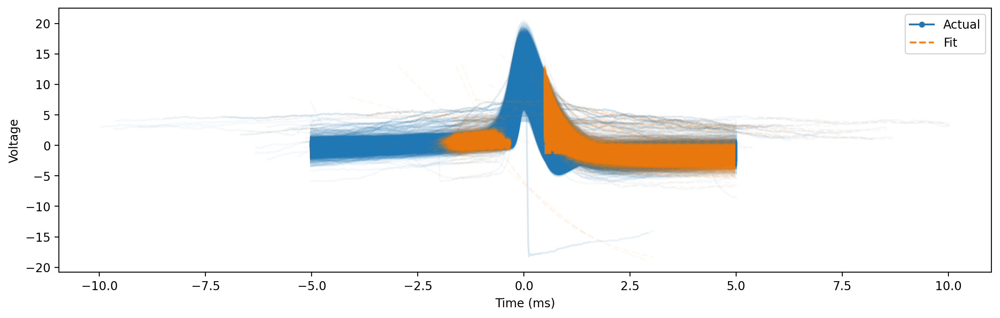

In [11]:
sp.plot()

### Filter spikes 

In [12]:
sp.filter_features()  

### Get spike dataframe (with spike times column)

In [13]:

df_features = sp.df_features

#add columns for spike times, both in idx and ms
df_features['spk_times_idx'] = sp.spike_inds
df_features['spk_times_ms'] = patch_times[sp.spike_inds]
df_features['spk_id'] = range(len(df_features))

In [14]:
df_features

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi,spk_times_idx,spk_times_ms,spk_id
0,0.030786,0.28,0.200051,7.895348,0.30,2.490041,0.000026,-0.880492,1.824179,53650,1.072487e+03,0
1,0.185567,0.26,0.442928,7.949770,0.30,2.641294,0.000002,-0.294561,1.631439,56987,1.139196e+03,1
2,0.877363,0.26,0.629470,7.800408,0.32,2.410221,0.000010,-0.435603,1.717796,59128,1.181995e+03,2
3,-0.052398,0.28,0.314866,7.699788,0.30,2.396309,0.000004,-0.445957,1.440387,61740,1.234210e+03,3
4,0.087457,0.28,0.582596,8.028814,0.32,2.347654,0.000003,-0.362595,1.215166,63119,1.261777e+03,4
...,...,...,...,...,...,...,...,...,...,...,...,...
12556,0.075823,0.38,0.147030,6.220482,0.40,1.113120,0.000015,-1.071736,1.615953,53934028,1.078165e+06,12549
12557,-0.070153,0.36,0.126203,6.108001,0.42,0.976829,0.000012,-0.968436,1.674837,53936094,1.078207e+06,12550
12558,0.116481,0.36,0.503001,6.513055,0.40,0.944731,0.000010,-0.534537,1.667992,53938460,1.078254e+06,12551
12559,0.036199,0.38,0.324115,6.458305,0.42,0.761761,0.000003,-0.770707,1.598364,53940789,1.078300e+06,12552


### Get spike times


In [15]:
spk_times_idx = df_features['spk_times_idx']
spk_times_ms = df_features['spk_times_ms']
spk_ids = df_features['spk_id']

In [16]:
df_features.columns

Index(['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp',
       'peak_width', 'peak_sharpness', 'exp_lambda', 'exp_const', 'log_isi',
       'spk_times_idx', 'spk_times_ms', 'spk_id'],
      dtype='str')

## STEP 2: Cluster spike groups 

#### Plot distribution of all features

Plotting spike features...
Removing outliers using IQR method (multiplier=3)


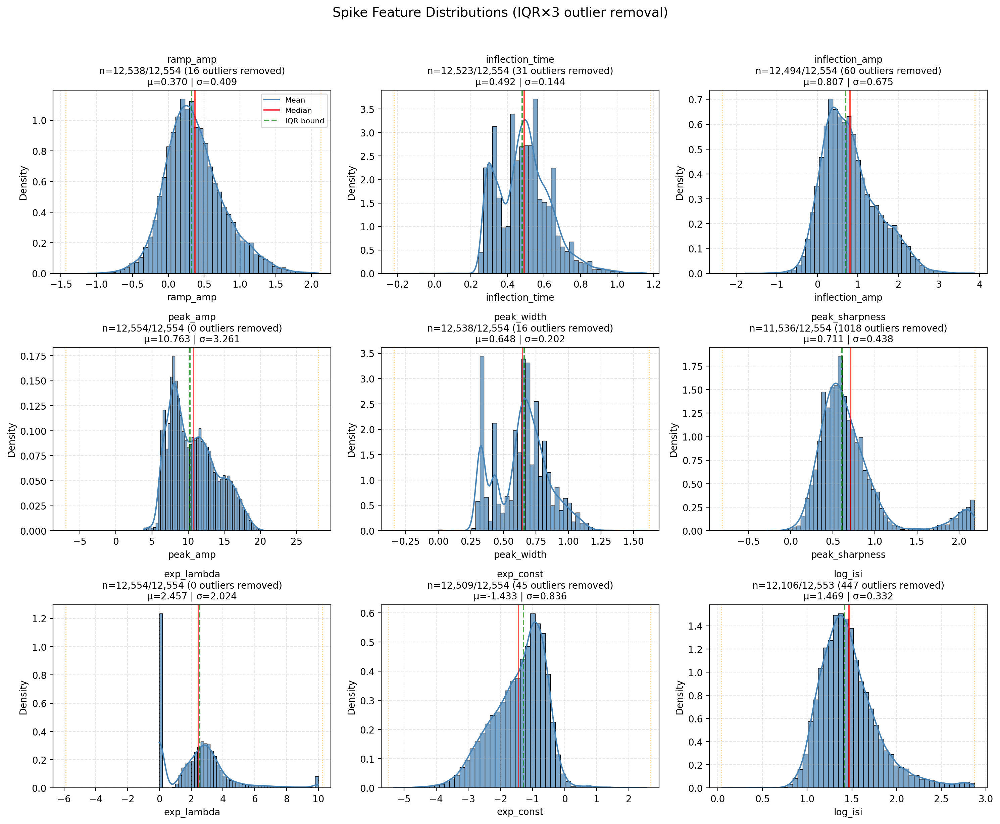


FEATURE DISTRIBUTION SUMMARY
Feature              Total N    Clean N    Outliers   % Removed  Mean       Std       
------------------------------------------------------------------------------------------
ramp_amp             12554      12538      16         0.1        0.370      0.409     
inflection_time      12554      12523      31         0.2        0.492      0.144     
inflection_amp       12554      12494      60         0.5        0.807      0.675     
peak_amp             12554      12554      0          0.0        10.763     3.261     
peak_width           12554      12538      16         0.1        0.648      0.202     
peak_sharpness       12554      11536      1018       8.1        0.711      0.438     
exp_lambda           12554      12554      0          0.0        2.457      2.024     
exp_const            12554      12509      45         0.4        -1.433     0.836     
log_isi              12553      12106      447        3.6        1.469      0.332     


In [17]:
plot_spike_feature_distributions(df_features)

In [18]:
cluster_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_df.pkl')

if FORCE_CLUSTER or not os.path.exists(cluster_pickle):
    # scan all numeric features and only cluster the ones that look multimodal
    df_features_clust, rep = cluster_multimodal_features(
        df_features.drop(["spk_times_idx"], axis = 1),
        max_k=3,
        suffix="_cluster",
        plot_each=True,  # set True if you want a quick plot per clustered feature, 
        manual_thresholds={'peak_amp':(9,14), 'peak_sharpness':1.5, 'peak_width':(0.35, 0.5)
        }
    )
    
    with open(cluster_pickle, 'wb') as f:
        pickle.dump(df_features_clust, f)
    print(f"  Saved: {os.path.basename(cluster_pickle)}")
else:
    print(f"  [cache] {os.path.basename(cluster_pickle)}")
    with open(cluster_pickle, 'rb') as f:
        df_features_clust = pickle.load(f)


  [cache] c21_cluster_df.pkl



===== CLUSTER REPORT: peak_amp_cluster =====
Found 3 clusters: ['high', 'low', 'mid']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low', 'mid']
  Groups: ('low', 'mid', 'high')
  Group names: ('Low', 'Mid', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


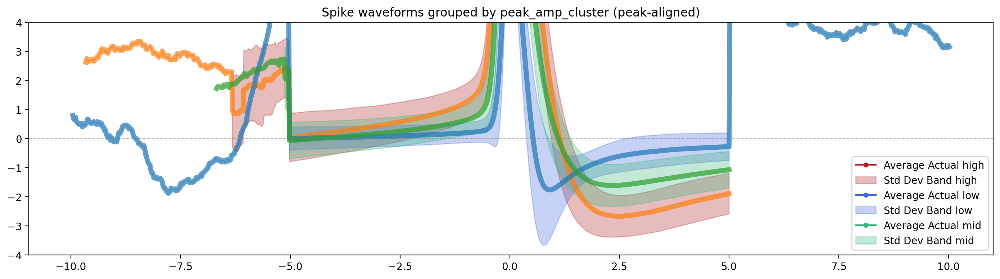


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


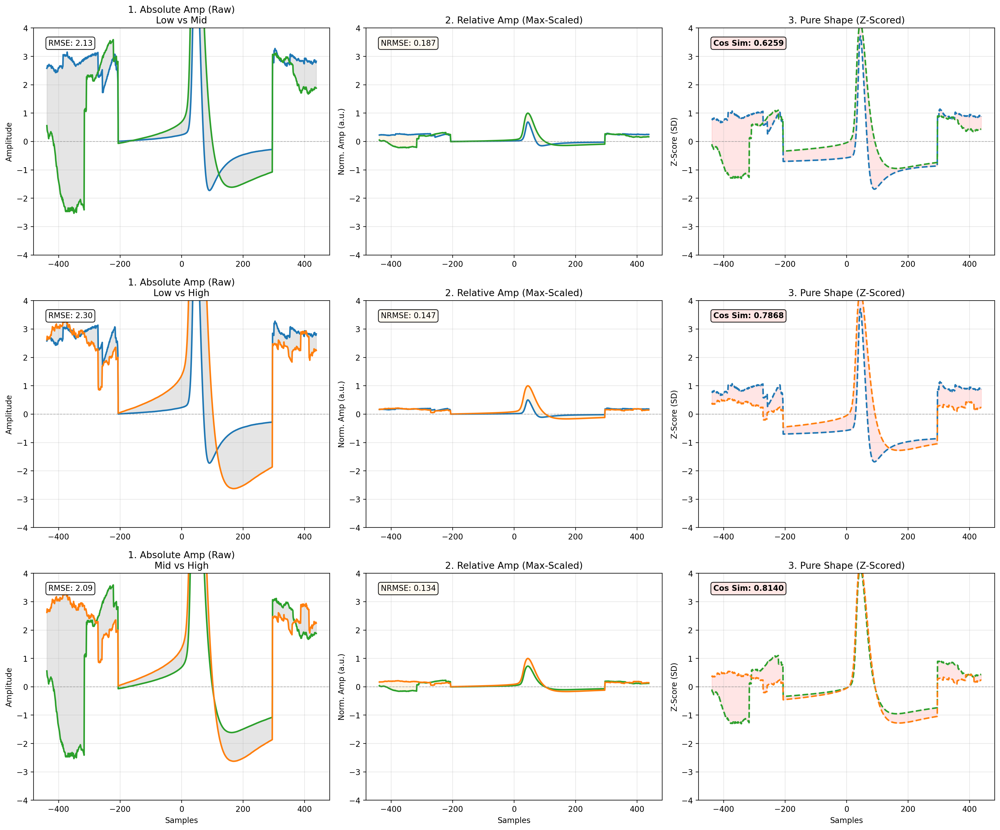


→ 2. Plotting cluster proportions over time


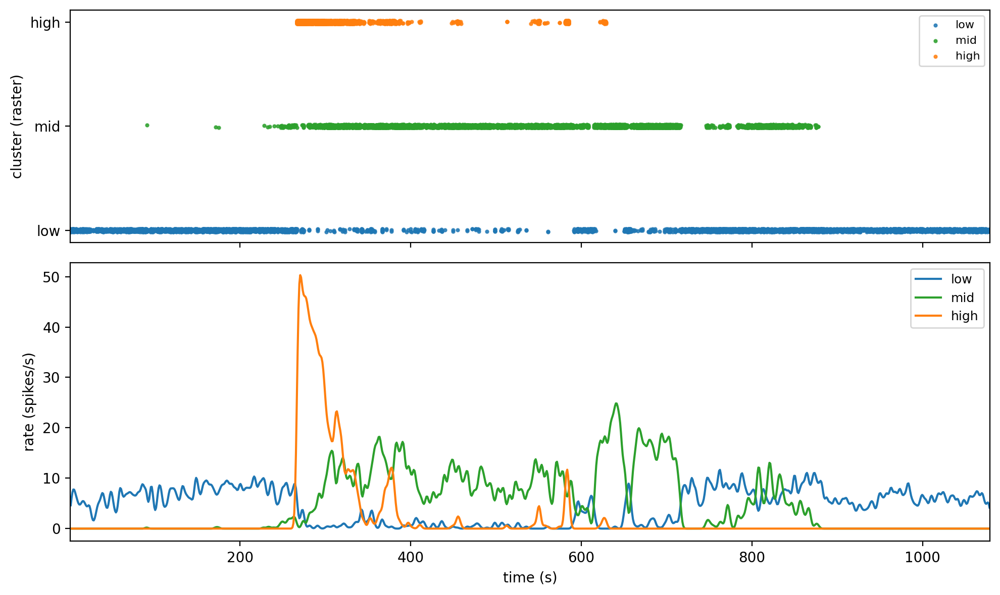


→ 3. Computing cluster transition matrix


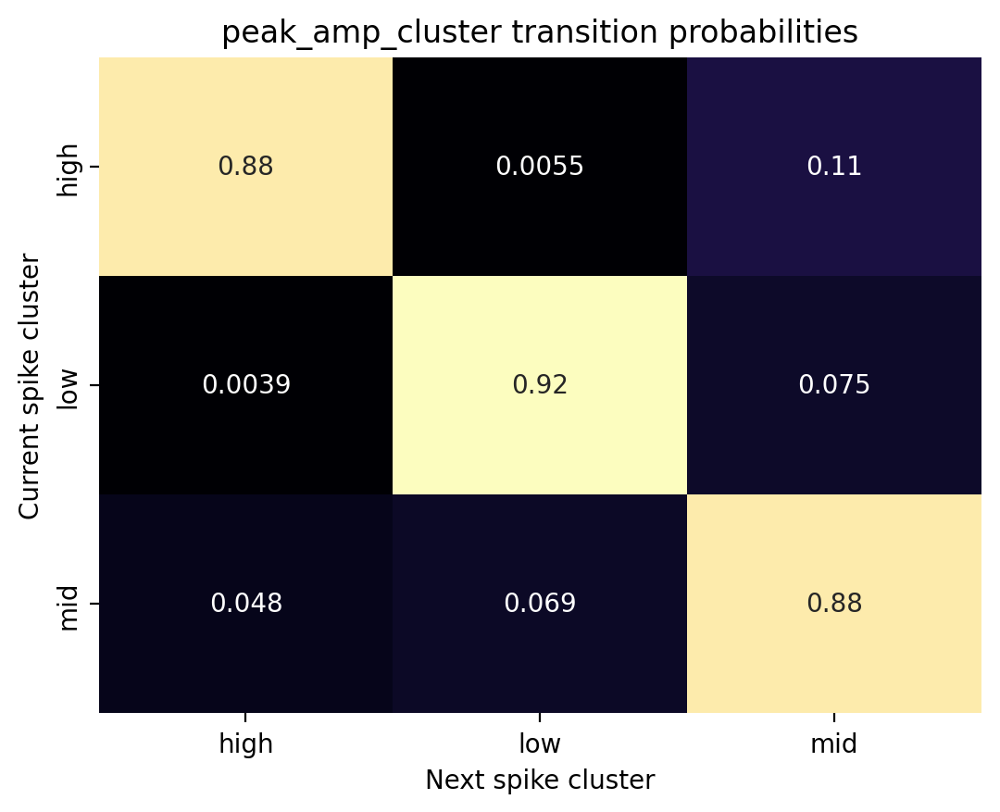


→ 4. Visualizing feature distributions by cluster


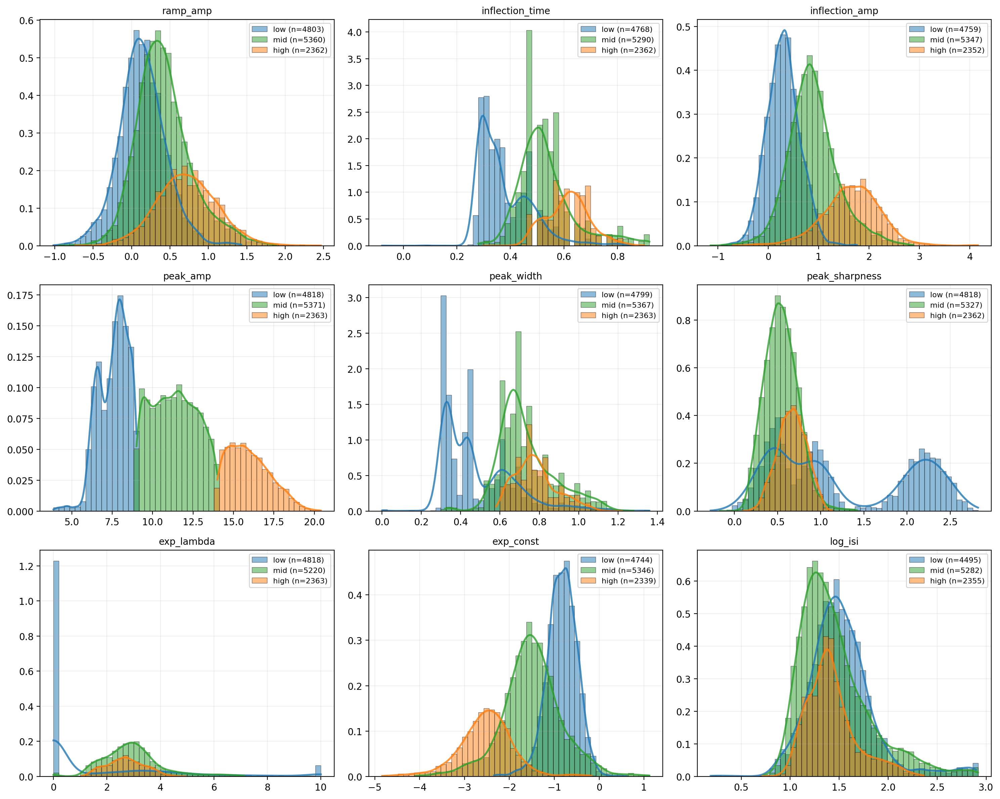


→ 5. Statistical analysis for: peak_amp
----------------------------------------

Test: Kruskal-Wallis (nonparametric)
Number of groups: 3
P-value: 0.000000
Significance: ***
η² effect size: 0.858
Interpretation: Very Large


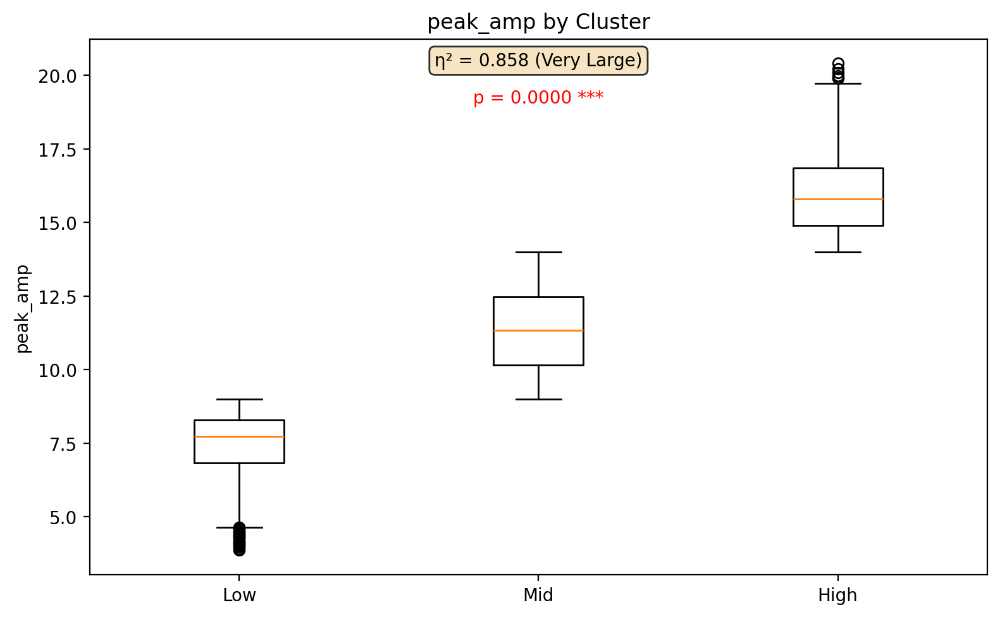


===== REPORT COMPLETE =====


===== CLUSTER REPORT: peak_width_cluster =====
Found 3 clusters: ['high', 'low', 'mid']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low', 'mid']
  Groups: ('low', 'mid', 'high')
  Group names: ('Low', 'Mid', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


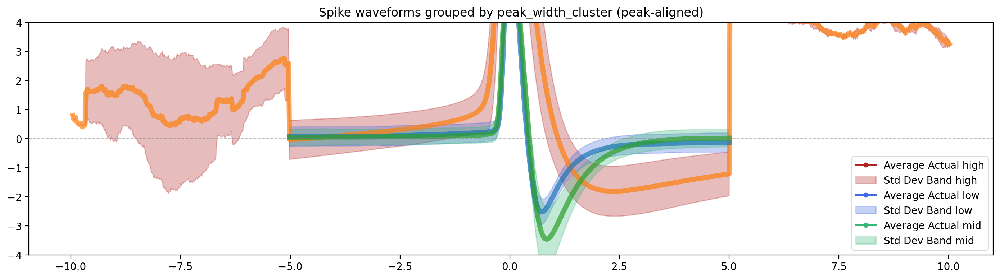


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


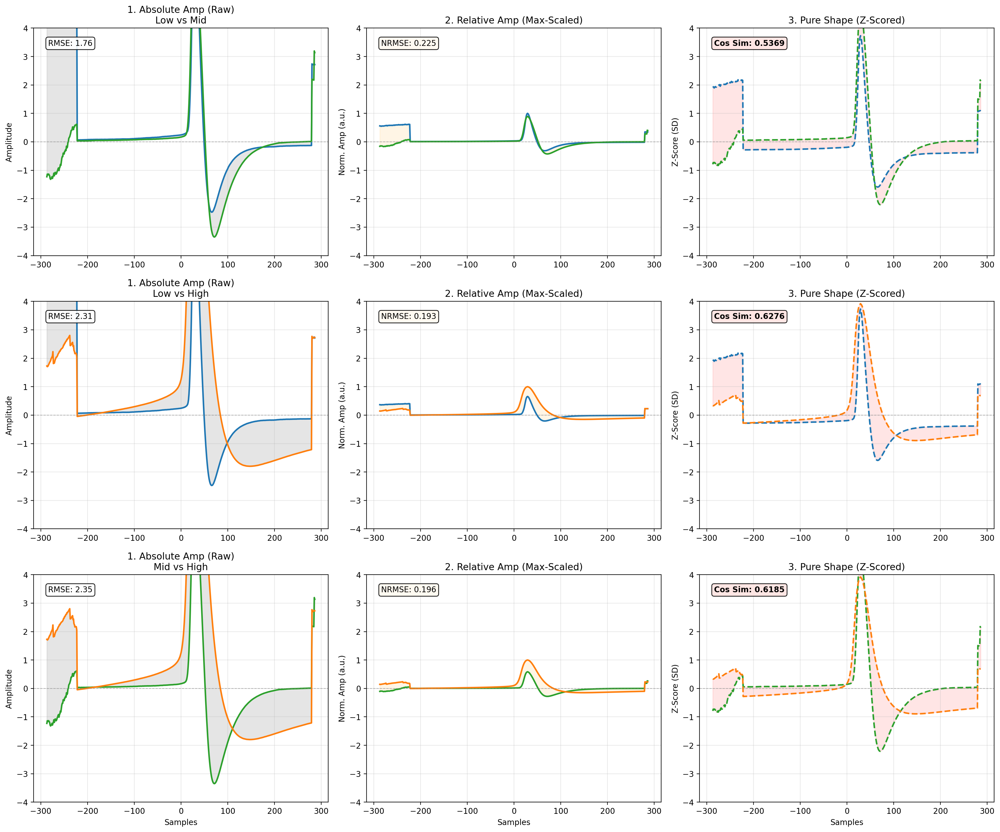


→ 2. Plotting cluster proportions over time


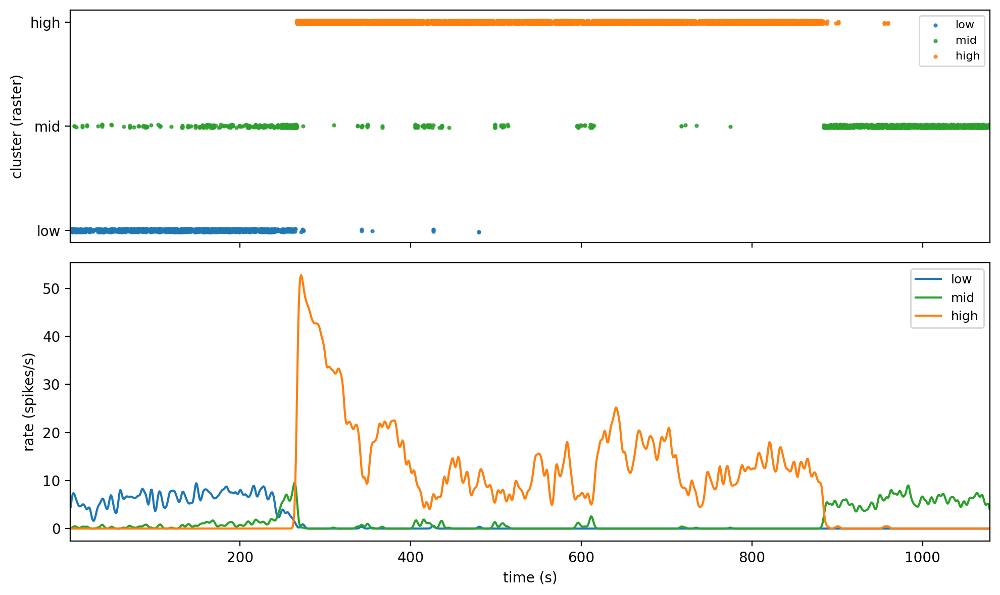


→ 3. Computing cluster transition matrix


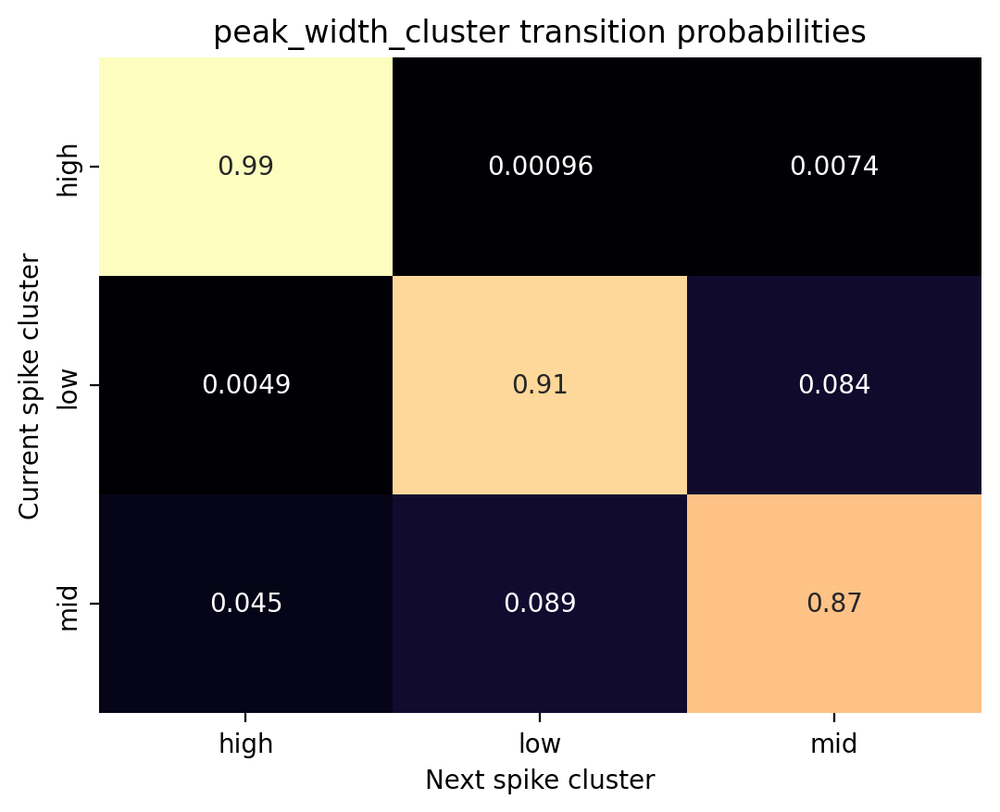


→ 4. Visualizing feature distributions by cluster


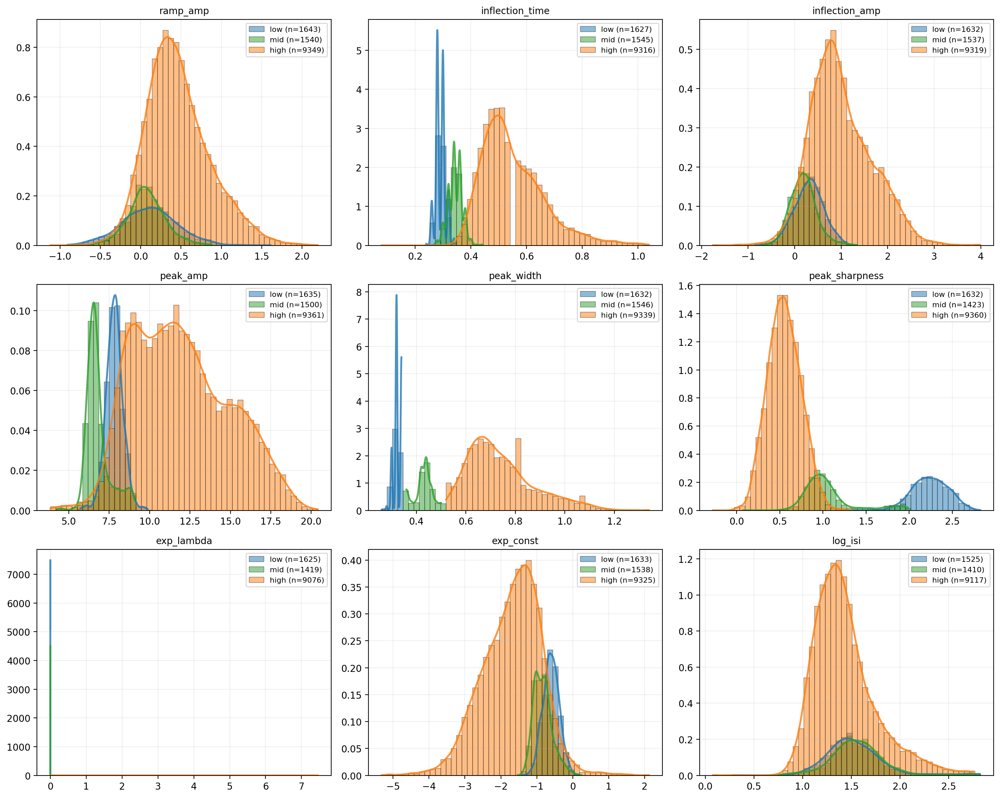


→ 5. Statistical analysis for: peak_width
----------------------------------------

Test: Kruskal-Wallis (nonparametric)
Number of groups: 3
P-value: 0.000000
Significance: ***
η² effect size: 0.582
Interpretation: Very Large


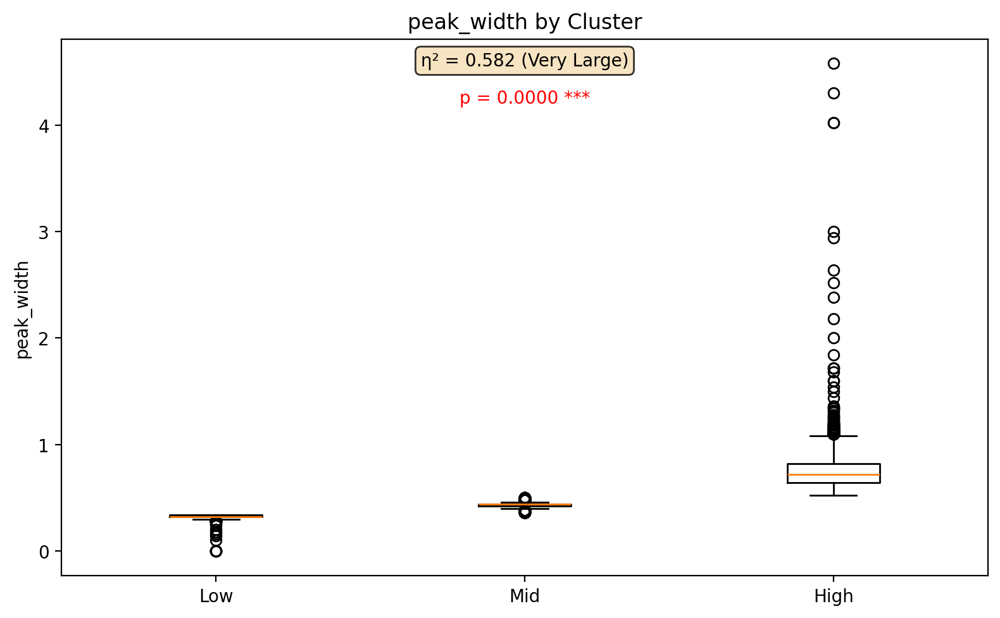


===== REPORT COMPLETE =====


===== CLUSTER REPORT: peak_sharpness_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


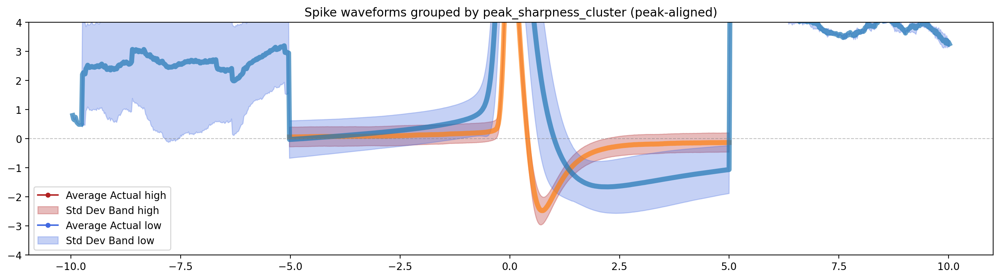


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


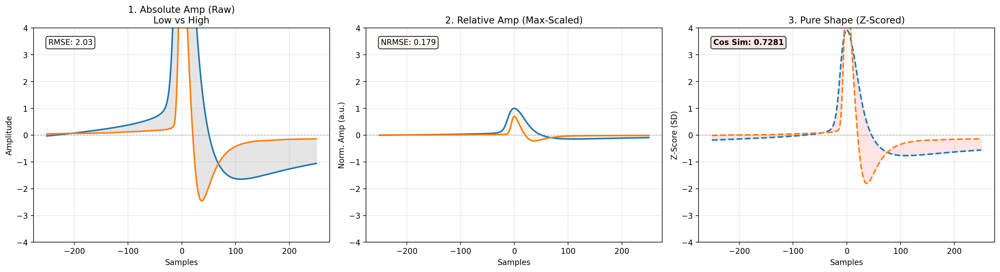


→ 2. Plotting cluster proportions over time


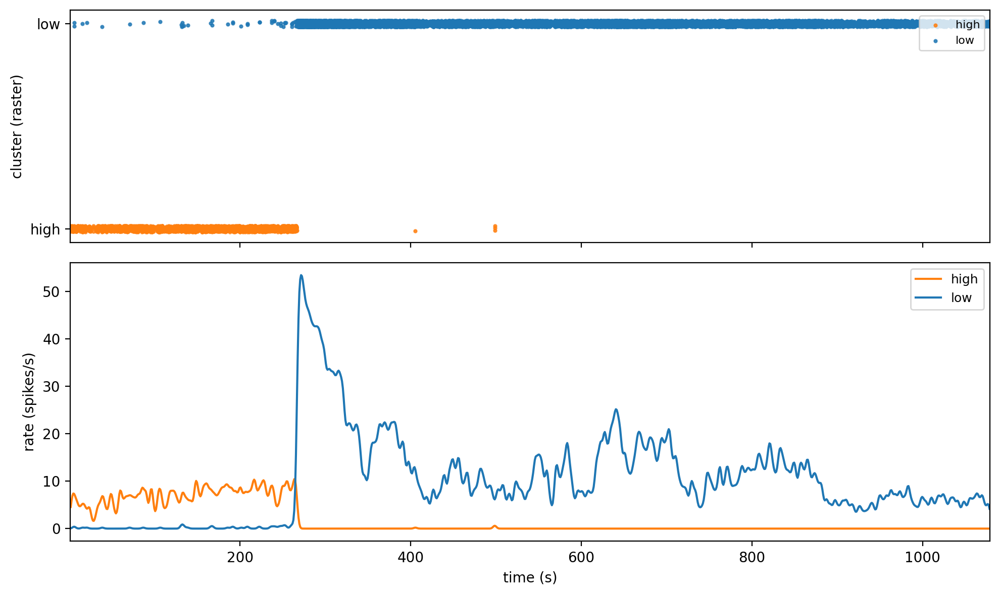


→ 3. Computing cluster transition matrix


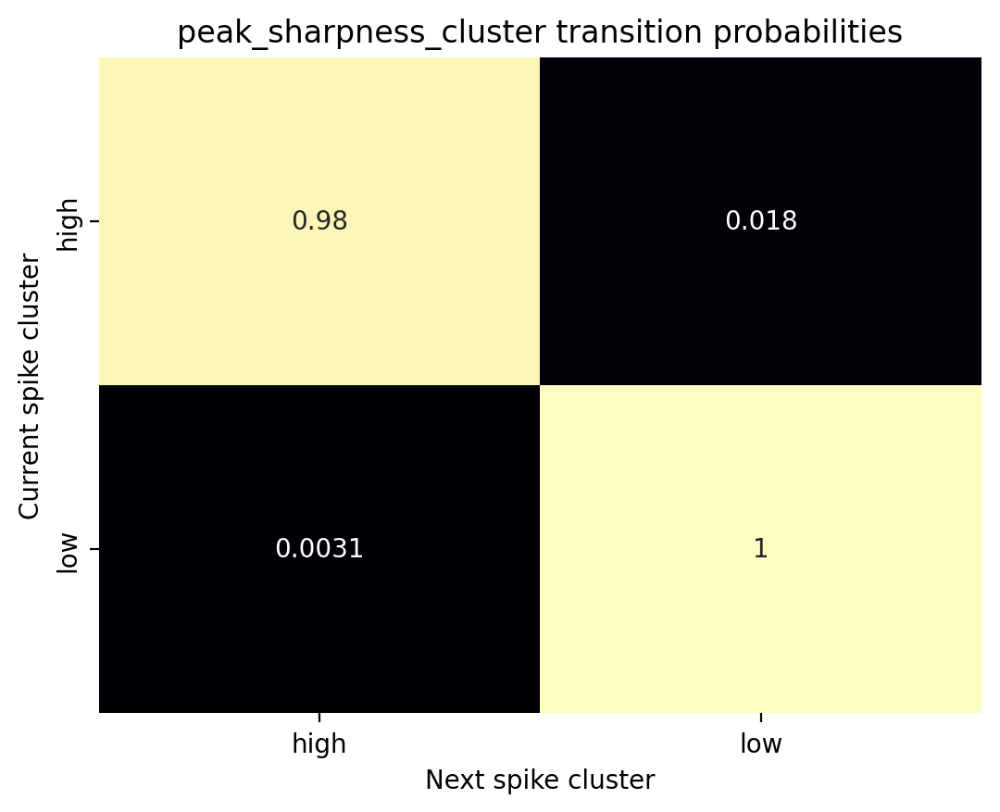


→ 4. Visualizing feature distributions by cluster


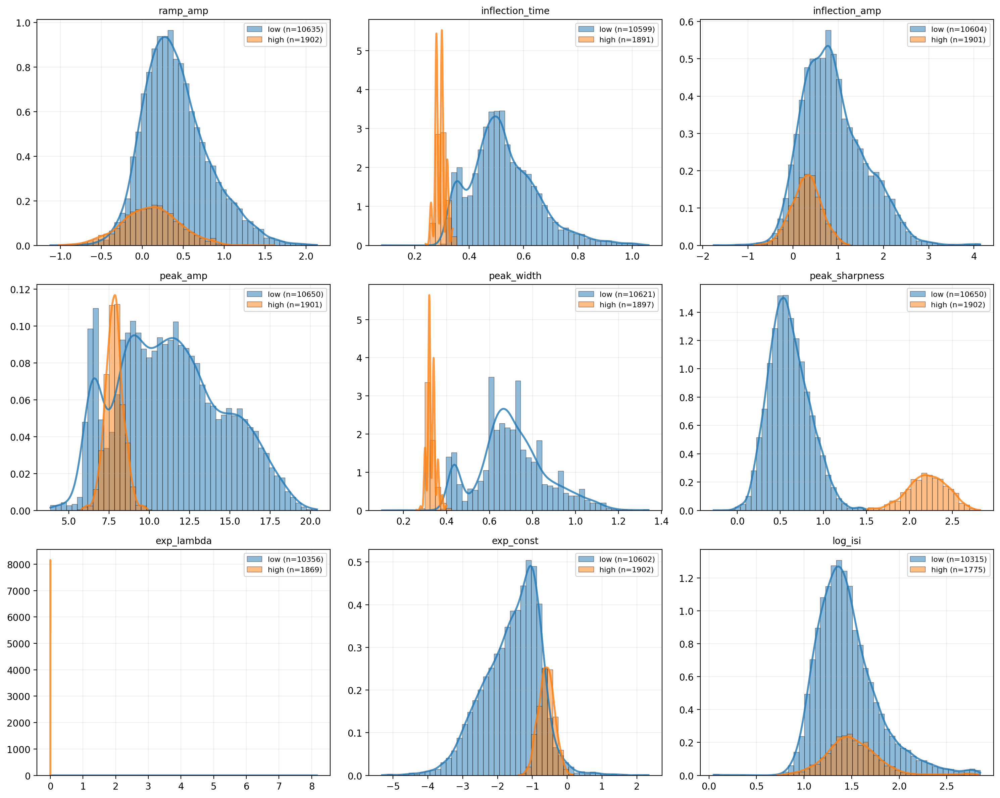


→ 5. Statistical analysis for: peak_sharpness
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.859
Interpretation: Very Large


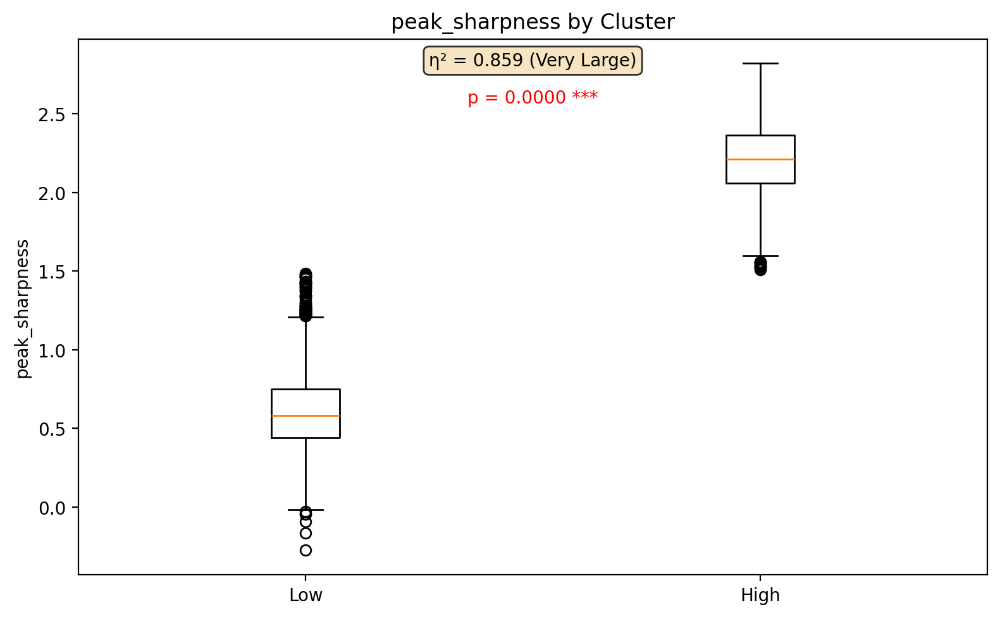


===== REPORT COMPLETE =====


===== CLUSTER REPORT: spk_times_ms_cluster =====
Found 3 clusters: ['high', 'low', 'mid']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low', 'mid']
  Groups: ('low', 'mid', 'high')
  Group names: ('Low', 'Mid', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


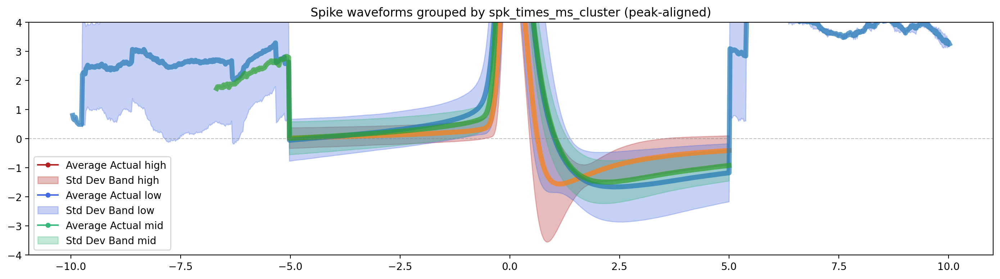


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


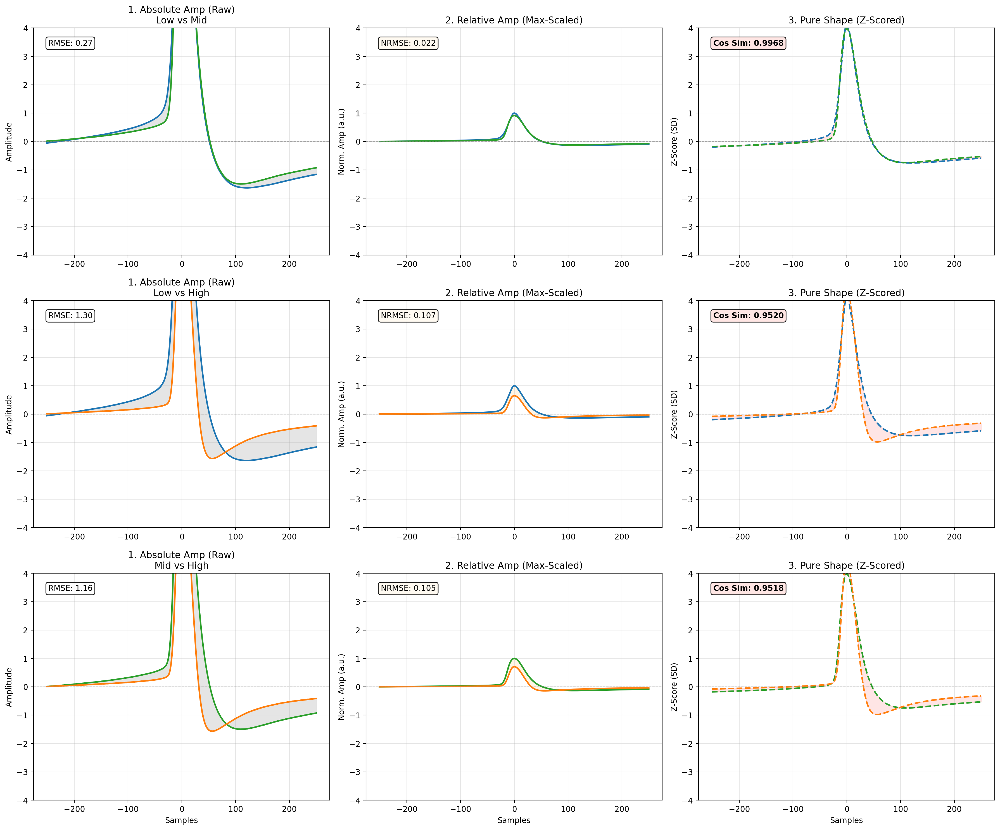


→ 2. Plotting cluster proportions over time


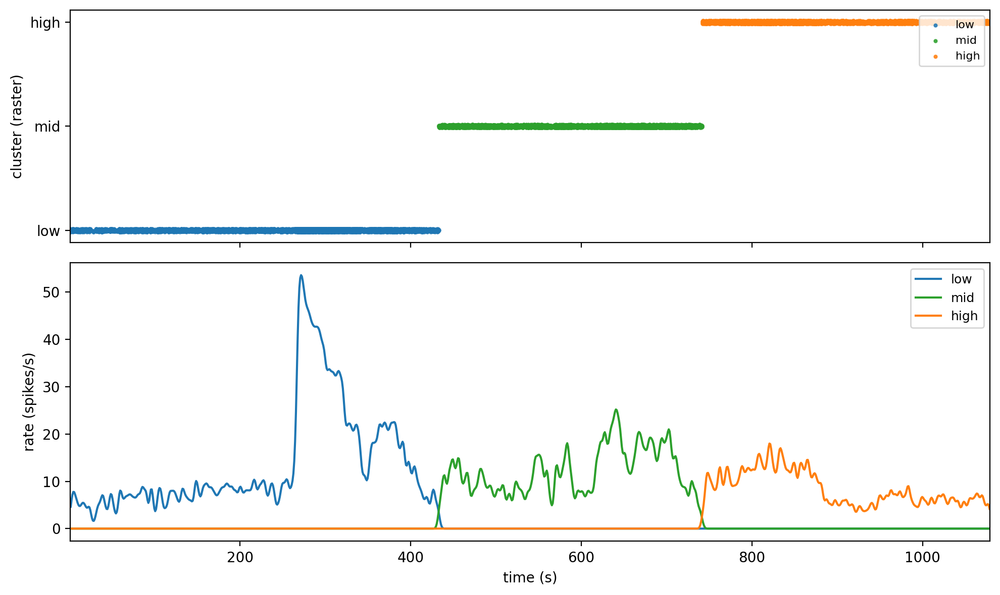


→ 3. Computing cluster transition matrix


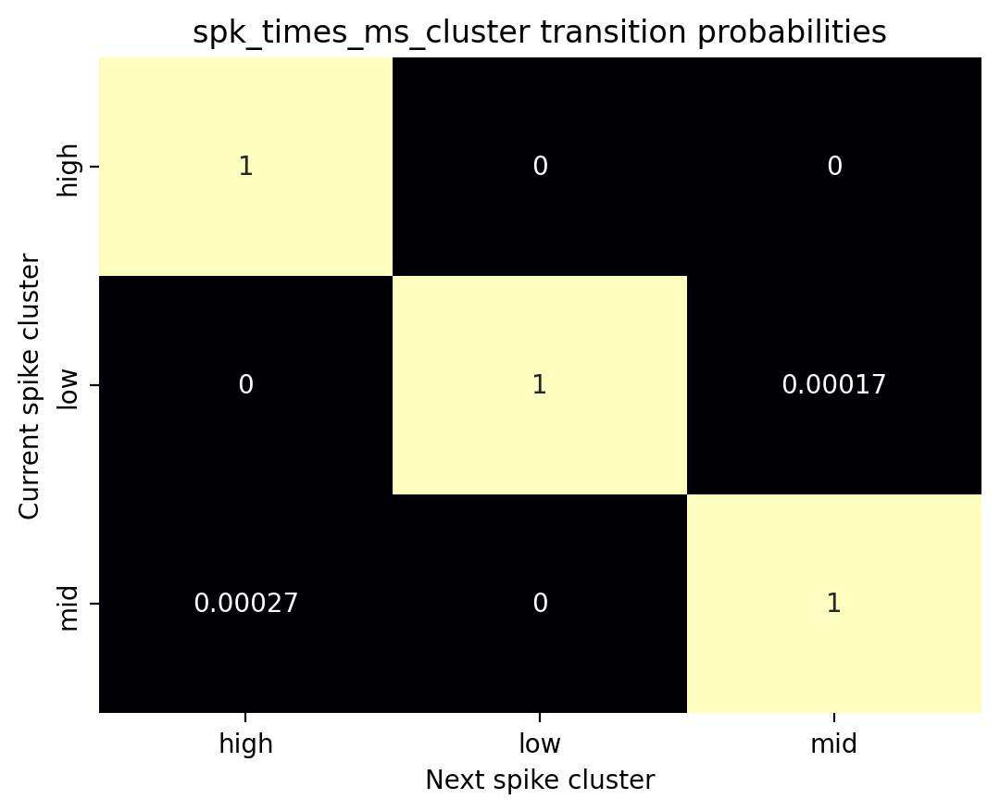


→ 4. Visualizing feature distributions by cluster


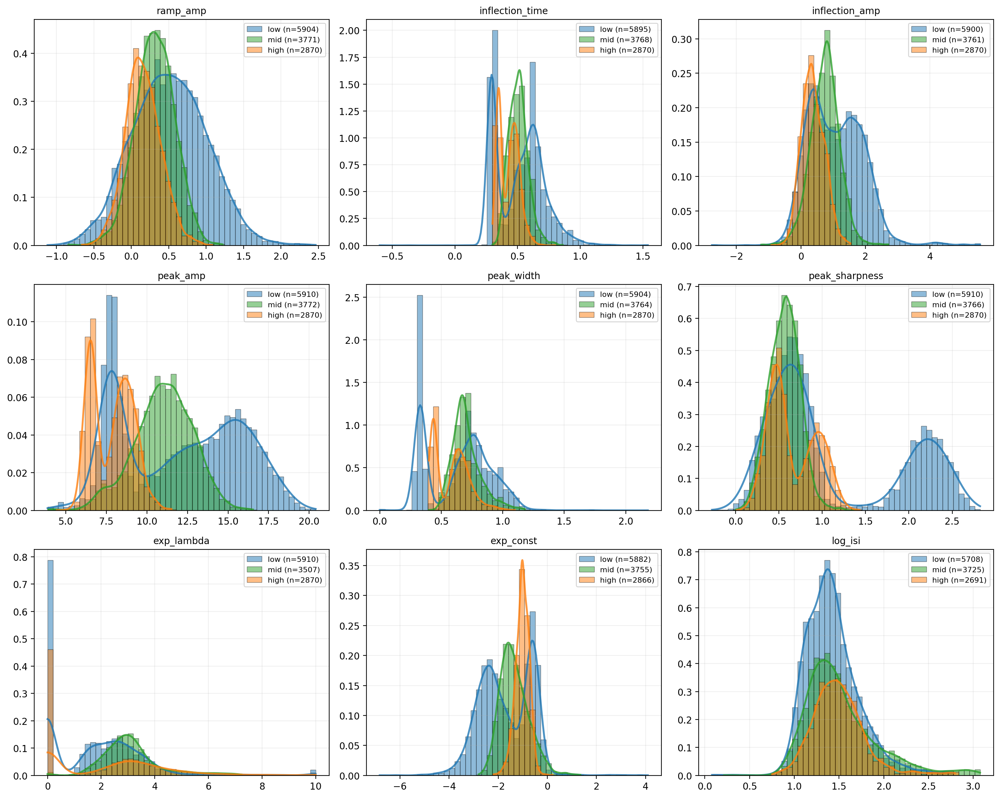


→ 5. Statistical analysis for: spk_times_ms
----------------------------------------

Test: Kruskal-Wallis (nonparametric)
Number of groups: 3
P-value: 0.000000
Significance: ***
η² effect size: 0.857
Interpretation: Very Large


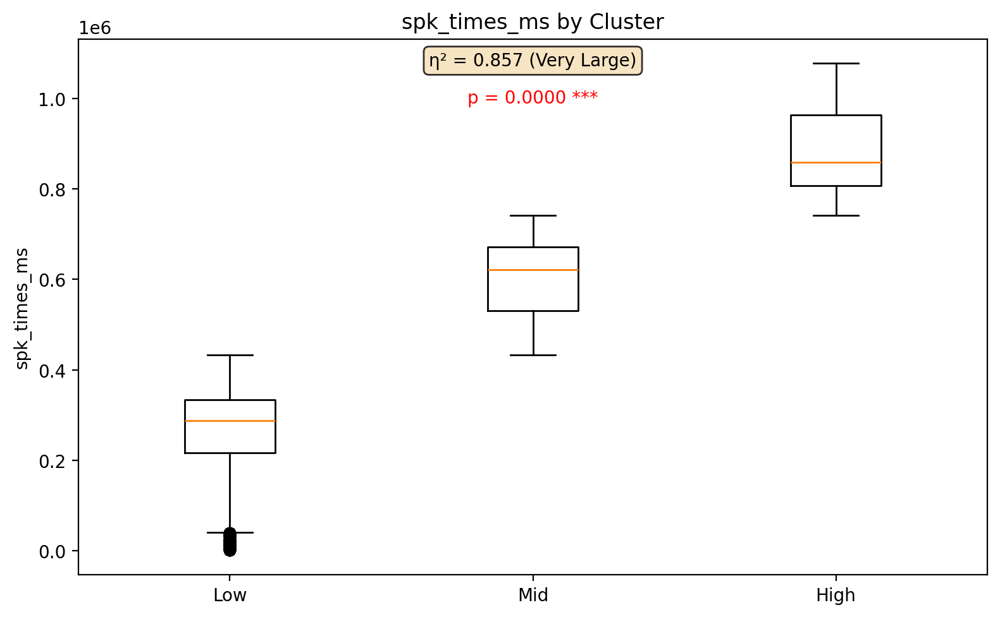


===== REPORT COMPLETE =====



In [19]:
all_reports = []

# Filter columns first to ensure the index is continuous
cluster_cols = [c for c in df_features_clust.columns if c.endswith("_cluster")]

for i, col in enumerate(cluster_cols):
    # Pass 'i' as the cluster_group_id
    row_df = plot_full_cluster_report(df_features_clust, sp, col, cluster_group_id=i)
    all_reports.append(row_df)

# Final Master DataFrame
master_report_df = pd.concat(all_reports, ignore_index=True)

In [20]:
# Save cluster quality report for population-level comparison analysis
report_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_report.pkl')
with open(report_pickle, 'wb') as f:
    pickle.dump(master_report_df, f)


In [21]:
# Compute and save peak-aligned average waveforms for each cluster group.
# Saved to a lightweight pickle used by the population comparison notebook.
wf_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_waveforms.pkl')
if FORCE_CLUSTER or not os.path.exists(wf_pickle):
    cluster_cols = [c for c in df_features_clust.columns if c.endswith('_cluster')]
    wf_data = compute_cluster_waveforms(sp, df_features_clust, cluster_cols)
    with open(wf_pickle, 'wb') as f:
        pickle.dump(wf_data, f)
    print(f"  Saved: {os.path.basename(wf_pickle)}")
else:
    print(f"  [cache] {os.path.basename(wf_pickle)}")


  [cache] c21_cluster_waveforms.pkl


#### Open all pickle chunks and reassamble 

#### Analyze by group

#### Plot avg specparam for each group for significant windows 